# Recomendador de inversiones inmoviliarias

## Datos origen:

- [Precio_medio_EUR_m2_alquiler](datasets/Precio_medio_EUR_m2_alquiler.csv)
- [Precio_medio_EUR_m2_compraventa](datasets/Precio_medio_EUR_m2_compraventa.csv)
- [BarcelonaCiutat_SeccionsCensals](datasets/BarcelonaCiutat_SeccionsCensals.csv)
- [idealista_datafile](datasets/idealista_datafile.csv)


## Tareas:

1. Dentificar toda la jerarquia de distritos y barrios
1. Modelo de ML para extrapolar precios estadístico de alquiler y compraventa a fecha de hoy
1. Asignar precio estadístico de alquiler y compraventa a cada inmueble basado en su barrio o distrito
1. Crear una puntuación para cada barrio o distrito de 0 a 1
1. Crear una puntuación para el precio de compra para cada inmueble de 0 a 1 en función del precio estadístico de compra de cada barrio o distrito
1. Crear una puntuación para el precio de alquiler para cada inmueble de 0 a 1 en función del precio estadístico de alquiler de cada barrio o distrito
1. Calcular la tasa de retorno de cada inmueble en función del precio de compra y el precio de alquiler
1. Crear una puntuación final para cada inmueble de 0 a 1 en función de las puntuaciones anteriores


In [463]:
!pip install openpyxl scikit-learn

In [464]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


## Carga de datos de Barcelona Datos con el Precio medio por superficie (€/m²) del alquiler de viviendas por distrito

Renta media mensual por superficie (€/m²) de alquiler de viviendas procedente de la estadística de fianzas del INCASOL. Se puede considerar que esta estadística tiene un carácter censal ya que se basa en el recuento de todos los contratos de alquiler que han depositado la fianza en el Incasòl en el período considerado.

La información de distritos y barrios está elaborada a partir de aquéllos viviendas que se han podido geolocalizar. El total de Barcelona puede no coincidir con la suma de compraventas de los distritos o de los barrios.No se publica la información de los ámbitos de menos de seis contratos registrados.

In [465]:
# Carga de datos de Barcelona Datos con el Precio medio por superficie (€/m²) del alquiler de viviendas por distrito

# Cargar estructura de jerarquica de municipio - distrito - barrio
# SeccionsCensals = pd.read_csv('datasets/BarcelonaCiutat_SeccionsCensals.csv')
# barrios = SeccionsCensals.groupby('nom_barri').min().drop(['codi_seccio_censal','geometria_etrs89','geometria_wgs84','codi_aeb'], axis=1).sort_values(by='codi_barri').reset_index().copy()

bcn_precios_int = pd.read_csv('datasets/gen_bcn_precios_int.csv')
bcn_precios = pd.read_csv('datasets/gen_bcn_precios.csv')
bcn_barrios = pd.read_csv('datasets/gen_bcn_barrios.csv')

# Conversión de mes a periodo
bcn_precios_int['mes'] = pd.to_datetime(bcn_precios_int['mes'])#.dt.to_period('M')
bcn_precios['mes'] = pd.to_datetime(bcn_precios['mes'])#.dt.to_period('M')

bcn_precios

,tipo,nombre,mes,precio_alquiler,precio_venta,superficie_venta,codi_districte,nom_districte,codi_barri
0,barri,baro de viver,2014-01-01 00:00:00+00:00,3.92,438.500000,92.0,9,sant andreu,58
1,barri,baro de viver,2014-02-01 00:00:00+00:00,NaN,NaN,NaN,9,sant andreu,58
2,barri,baro de viver,2014-03-01 00:00:00+00:00,NaN,NaN,56.0,9,sant andreu,58
3,barri,baro de viver,2014-04-01 00:00:00+00:00,4.03,NaN,NaN,9,sant andreu,58
4,barri,baro de viver,2014-05-01 00:00:00+00:00,NaN,NaN,NaN,9,sant andreu,58
...,...,...,...,...,...,...,...,...,...
10960,municipi,barcelona,2024-05-01 00:00:00+00:00,NaN,3792.943830,NaN,-1,NaN,-1
10961,municipi,barcelona,2024-06-01 00:00:00+00:00,NaN,3845.827810,122345.0,-1,NaN,-1
10962,municipi,barcelona,2024-07-01 00:00:00+00:00,NaN,3835.180837,NaN,-1,NaN,-1
10963,municipi,barcelona,2024-08-01 00:00:00+00:00,NaN,3832.821747,NaN,-1,NaN,-1


## 3. **Análisis de Calidad de los Datos**: 
Evaluar la calidad de los datos, identificando problemas como valores faltantes, inconsistencias, errores o duplicados.

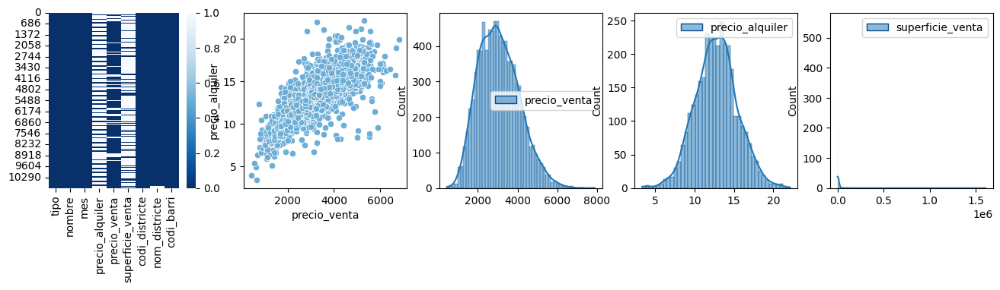

<Axes: >

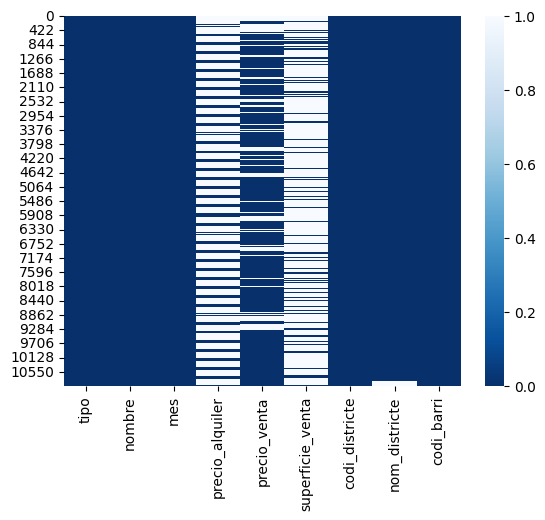

In [466]:
import matplotlib.cm as cm

def plot_data_dist(dfs):

    cmaps = ['Blues_r', 'Greens_r', 'Oranges_r', 'Reds_r', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'PuBuGn', 'PuRd', 'OrRd', 'YlGnBu', 'YlGn', 'YlOrBr', 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'Greys', 'Purples', 'YlOrRd']

    fig, axs = plt.subplots(len(dfs), 5, figsize=(16, 3*len(dfs)))
    # plt.grid(True)
    # Crear subplots
    for idx, df in enumerate(dfs):
        sns.heatmap(df.isnull(), annot=False, cmap=cmaps[idx], ax=axs[idx, 0] if len(dfs) > 1 else axs[0])
        sns.scatterplot(df, x='precio_venta', y='precio_alquiler', color=cm.get_cmap(cmaps[idx])(0.5), ax=axs[idx, 1] if len(dfs) > 1 else axs[1])
        sns.histplot(df[['precio_venta']], kde=True, color=cm.get_cmap(cmaps[idx])(0.5), edgecolor=cm.get_cmap(cmaps[idx])(0.1), ax=axs[idx, 2] if len(dfs) > 1 else axs[2])
        sns.histplot(df[['precio_alquiler']], kde=True, color=cm.get_cmap(cmaps[idx])(0.5), edgecolor=cm.get_cmap(cmaps[idx])(0.1), ax=axs[idx, 3] if len(dfs) > 1 else axs[3])
        sns.histplot(df[['superficie_venta']], kde=True, color=cm.get_cmap(cmaps[idx])(0.5), edgecolor=cm.get_cmap(cmaps[idx])(0.1), ax=axs[idx, 4] if len(dfs) > 1 else axs[4])
    plt.show()

plot_data_dist([bcn_precios])

sns.heatmap(bcn_precios.isnull(), annot=False, cmap='Blues_r')


,tipo,count
0,barri,9546
1,districte,1290
2,municipi,129


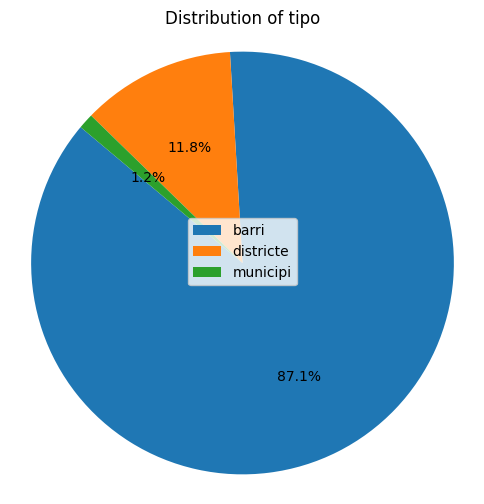

,nom_districte,count
0,nou barris,1806
1,horta guinardo,1548
2,sant marti,1419
3,sants montjuic,1290
4,sant andreu,1032
5,eixample,903
6,sarria sant gervasi,903
7,gracia,774
8,ciutat vella,645
9,les corts,516


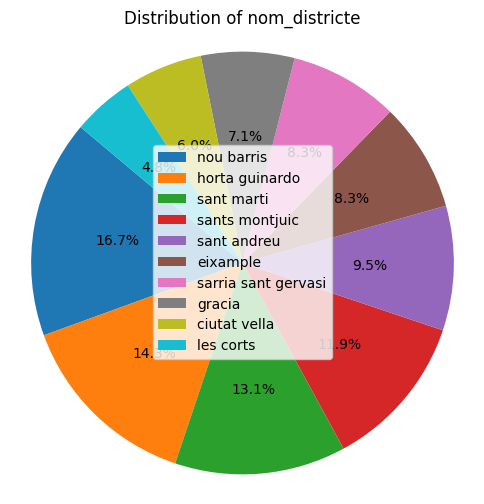

In [467]:
for c in ['tipo', 'nom_districte']:
    reason_counts = bcn_precios[c].value_counts()
    display(reason_counts.reset_index())
    # Create a pie plot using Seaborn for the 'status' column
    fig = plt.figure(figsize=(6,6))
    plt.title(f'Distribution of {c}')
    plt.pie(reason_counts, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    fig.legend(loc='center', labels=reason_counts.index)
    plt.show()

Gráfico de dispersión de precio_alquiler vs precio_venta


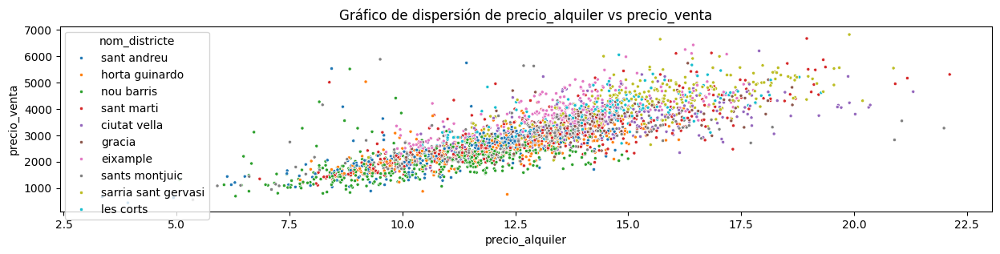

Gráfico de dispersión de precio_alquiler vs superficie_venta


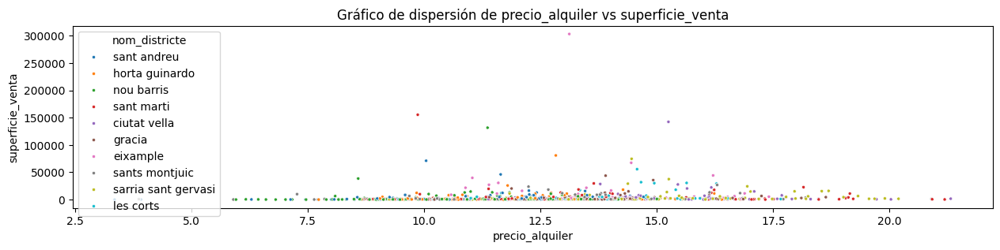

Gráfico de dispersión de precio_alquiler vs codi_districte


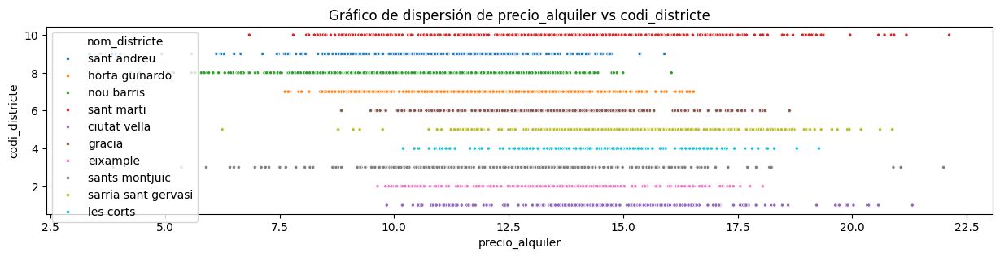

Gráfico de dispersión de precio_alquiler vs codi_barri


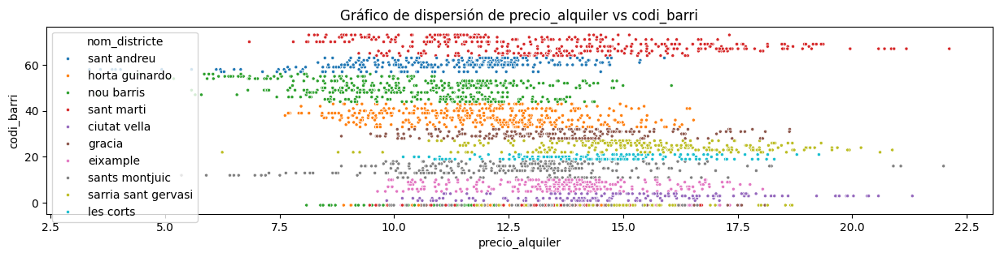

Gráfico de dispersión de precio_venta vs superficie_venta


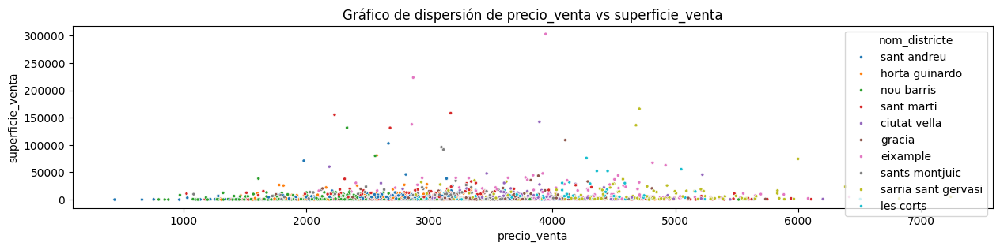

Gráfico de dispersión de precio_venta vs codi_districte


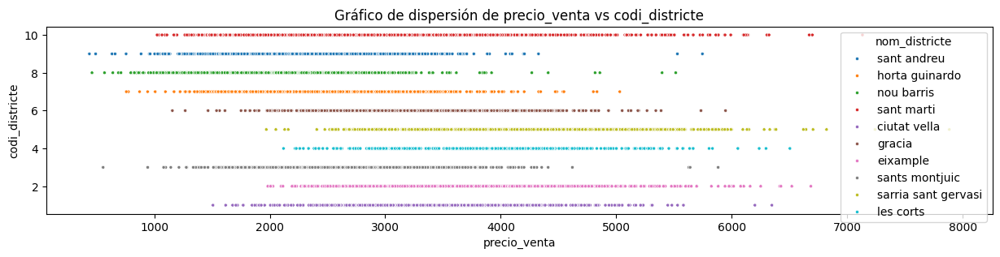

Gráfico de dispersión de precio_venta vs codi_barri


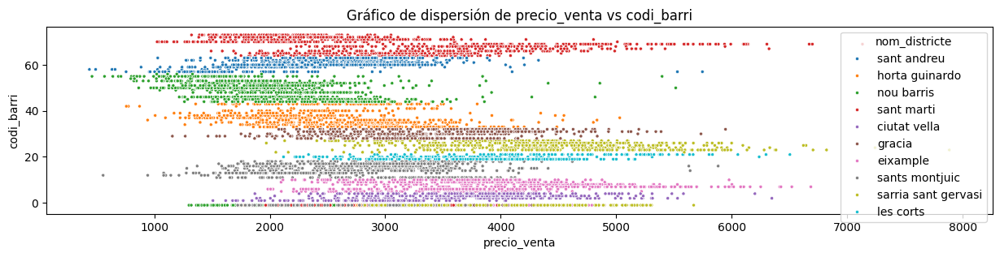

Gráfico de dispersión de superficie_venta vs codi_districte


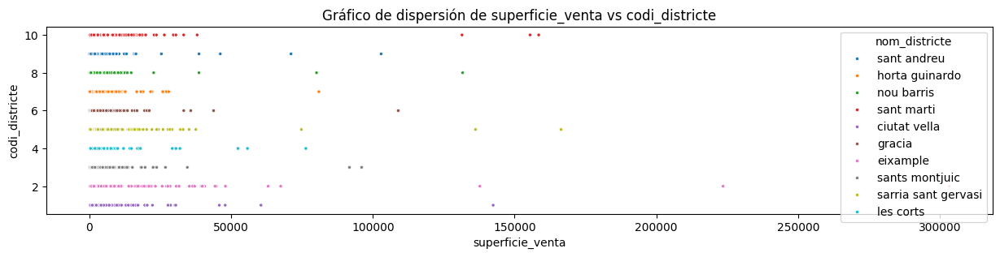

Gráfico de dispersión de superficie_venta vs codi_barri


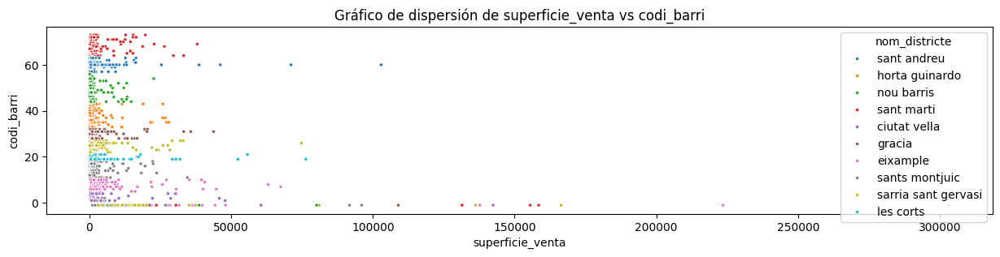

Gráfico de dispersión de codi_districte vs codi_barri


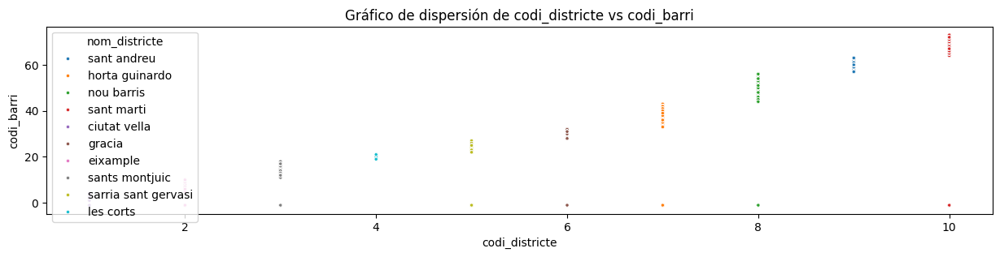

In [468]:
import itertools

# Genera gráficos de dispersión para todas las combinaciones de columnas numéricas

columnas_numericas=bcn_precios.describe().columns.tolist()

for c1, c2 in itertools.combinations(columnas_numericas, 2):
    print(f'Gráfico de dispersión de {c1} vs {c2}')
    fig = plt.figure(figsize=(15, 3))
    plt.title(f'Gráfico de dispersión de {c1} vs {c2}')
    if bcn_precios[c1].dtype.kind != 'M' and bcn_precios[c2].dtype.kind == 'M':
        t = c1
        c1 = c2
        c2 = t
    sns.scatterplot(data=bcn_precios, x=c1, y=c2, marker='.', hue='nom_districte')
    # if bcn_precios[c1].dtype.kind != 'M' and bcn_precios[c2].dtype.kind != 'M':
    #     z = np.polyfit(bcn_precios[c1].dropna(subset=[c1,c2]), bcn_precios[c2].dropna(subset=[c1,c2]), 1)
    #     p = np.poly1d(z)
    #     plt.plot(bcn_precios[c1],p(bcn_precios[c1]),"r--")
    #     # plt.hexbin(bcn_precios=bcn_precios, x=c1, y=c2, gridsize=30, cmap='Blues')

    plt.show()

## 1. **Análisis de Series de Tiempo**: 
Análisis de tendencias y patrones temporales presentes en los datos.

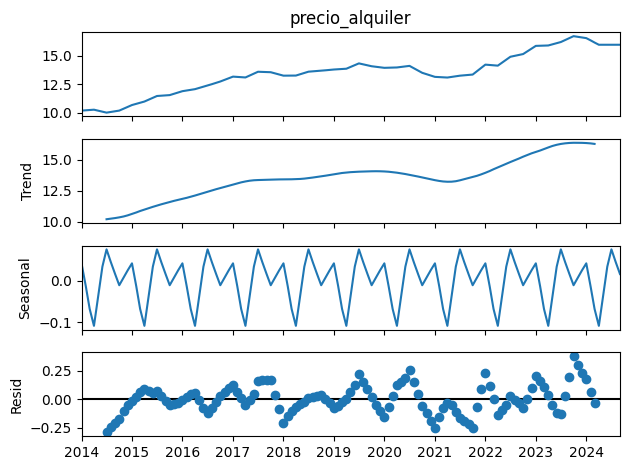

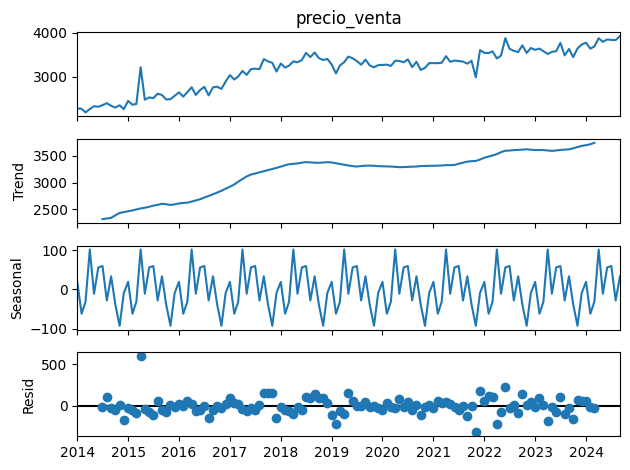

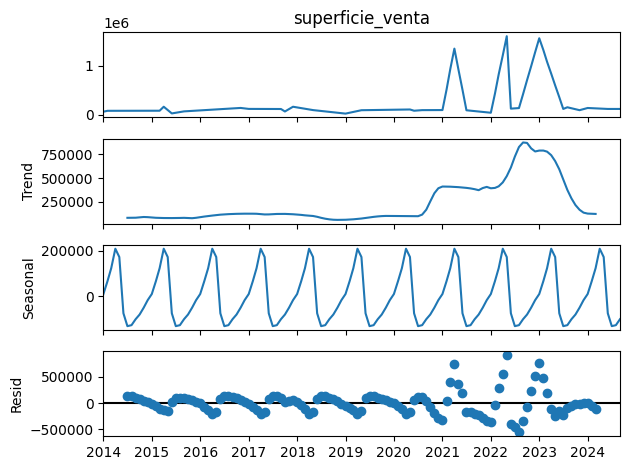

In [469]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición de series temporales para cada columna numérica individual
for c in ['precio_alquiler', 'precio_venta', 'superficie_venta']:
    df = bcn_precios[bcn_precios['nombre'] == 'barcelona'].interpolate().set_index('mes')[c]
    seasonal_decompose(df).plot()
    plt.show()
 

### Conclusiones por componente y campo:

1. **Componente Observada (Serie Original)**: `precio_alquiler`
   - La línea superior muestra el comportamiento general de los precios de alquiler a lo largo del tiempo.
   - Existe una tendencia ascendente clara, lo que indica un aumento generalizado en los precios de alquiler durante el periodo analizado (2014-2024).

2. **Tendencia (Trend)**: `precio_alquiler`
   - La tendencia suavizada refleja un crecimiento sostenido en los precios de alquiler, con una ligera estabilización o disminución a partir de 2023. Esto sugiere un cambio potencial en el mercado o un límite en el crecimiento.

3. **Estacionalidad (Seasonal)**: `precio_alquiler`
   - Se observa un patrón repetitivo anual, lo que indica que los precios de alquiler tienen un comportamiento cíclico predecible en determinados meses. Esto podría estar asociado a factores estacionales, como la demanda de alquiler en ciertas épocas del año (por ejemplo, por turismo o ciclos escolares).

4. **Residuales (Resid)**: `precio_alquiler`
   - Los residuos muestran las irregularidades o variaciones no explicadas por la tendencia ni la estacionalidad.
   - Aunque hay cierta dispersión, los valores residuales permanecen relativamente cercanos a cero, lo que indica que el modelo de descomposición captura bien el comportamiento general de la serie.

1. **Componente Observada (Serie Original)**: `precio_venta`
   - La línea superior muestra una tendencia general al alza en los precios de venta desde 2014 hasta 2024, con algunas oscilaciones en ciertos periodos.
   - Se observan picos y caídas notables alrededor de 2015-2016 y 2020, lo que podría estar relacionado con eventos económicos o de mercado específicos.

2. **Tendencia (Trend)**: `precio_venta`
   - La tendencia suavizada evidencia un aumento progresivo en los precios de venta durante la mayor parte del periodo.
   - A partir de 2020, la tendencia parece estabilizarse, aunque mantiene un crecimiento moderado hacia 2024, reflejando un mercado más equilibrado en los últimos años.

3. **Estacionalidad (Seasonal)**: `precio_venta`
   - Existe un patrón cíclico recurrente que indica fluctuaciones estacionales en los precios de venta.
   - Estas variaciones podrían estar relacionadas con factores temporales, como épocas del año en las que aumenta la actividad de compra-venta de propiedades.

4. **Residuales (Resid)**: `precio_venta`
   - Los residuos muestran las desviaciones no explicadas por la tendencia ni la estacionalidad.
   - Se observan algunos puntos atípicos (outliers), especialmente alrededor de 2015 y 2020, lo que sugiere eventos específicos que impactaron temporalmente en los precios.

### Conclusión General: 
- El mercado de alquiler sigue una tendencia de crecimiento a largo plazo, con fluctuaciones estacionales bien definidas.
- Las ligeras irregularidades en los residuos sugieren que hay factores adicionales que podrían influir en los precios pero que no siguen patrones sistemáticos.
- El precio de venta muestra un crecimiento sostenido a largo plazo, con patrones estacionales bien definidos.
- Los residuos y puntos atípicos pueden estar vinculados a cambios en políticas económicas, fluctuaciones de mercado, o eventos globales, como la pandemia en 2020.

### Próximos pasos:
- Analizar más profundamente la estacionalidad para entender qué factores externos influyen en los ciclos anuales.
- Explorar los residuos para detectar posibles eventos atípicos o factores externos específicos que afectaron los precios en ciertos periodos. 
- Analizar los picos y caídas inusuales para identificar posibles eventos externos o internos que los expliquen.
- Realizar un modelo predictivo considerando tanto la tendencia como la estacionalidad, para anticipar futuros comportamientos del mercado.



## 6. **Análisis de Correlación**: 

Evaluar las relaciones y asociaciones entre las variables mediante matrices de correlación y análisis de dependencias.


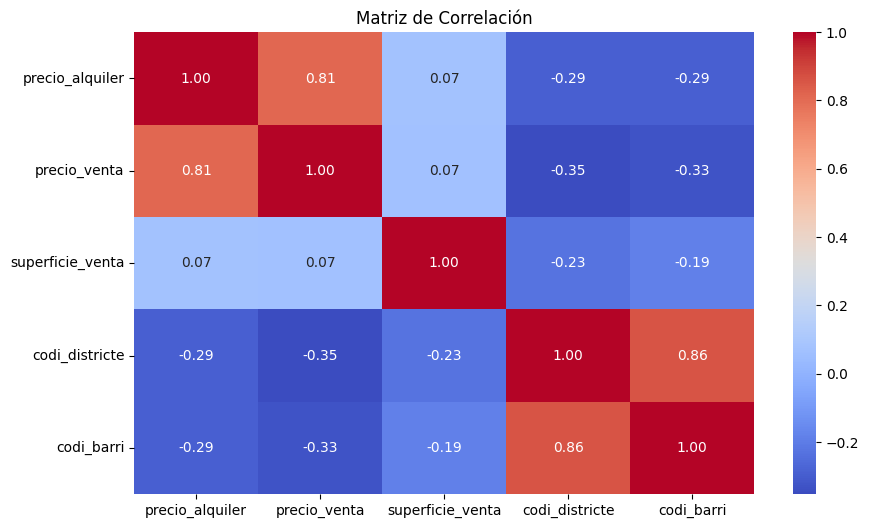

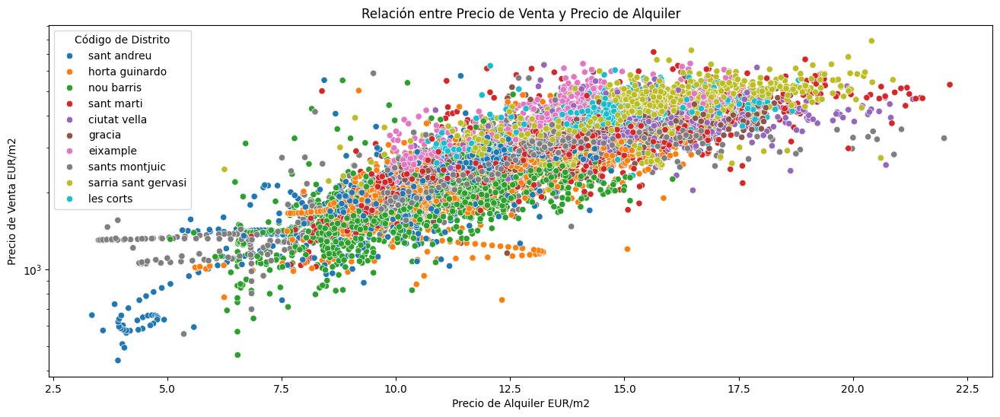

In [470]:
# Preprocesar el dataframe (opcional)
# Rellenar NaN con interpolación o algún criterio si es necesario
# bcn_precios.fillna(method='ffill', inplace=True)

# Selección de variables numéricas para la correlación
numerical_cols = ["precio_alquiler", "precio_venta", "superficie_venta", "codi_districte", "codi_barri"]

# Calcular matriz de correlación
correlation_matrix = bcn_precios_int[numerical_cols].corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlación")
plt.show()

# Análisis de dependencias
# Relación precio_venta vs superficie_venta
plt.figure(figsize=(16, 6))
sns.scatterplot(data=bcn_precios_int, y="precio_venta", x="precio_alquiler", hue="nom_districte")
plt.title("Relación entre Precio de Venta y Precio de Alquiler")
plt.xlabel("Precio de Alquiler EUR/m2")
plt.ylabel("Precio de Venta EUR/m2")
plt.yscale('log')
plt.legend(title="Código de Distrito")
plt.show()


### Conclusión sobre las relaciones entre las variables con base en la matriz de correlación:

1. **Relación fuerte entre `precio_alquiler` y `precio_venta`**:
   - Existe una correlación positiva alta (0.80), lo que indica que cuando el precio de alquiler aumenta, también tiende a aumentar el precio de venta. Esto sugiere una relación directa entre estos dos mercados.

2. **Baja correlación entre `superficie_venta` y las demás variables**:
   - `superficie_venta` no muestra una correlación significativa con ninguna de las otras variables (valores cercanos a 0). Esto podría implicar que el tamaño no es un factor determinante en las variaciones de precio o que otros factores influyen más.

3. **Relaciones negativas con `codi_districte` y `codi_barri`**:
   - Las variables `codi_districte` y `codi_barri` tienen correlaciones negativas con los precios (`precio_alquiler` y `precio_venta`), lo que podría reflejar diferencias geográficas: en ciertos distritos o barrios, los precios tienden a ser más bajos.

4. **Alta correlación entre `codi_districte` y `codi_barri` (0.86)**:
   - Esto es lógico, ya que ambos códigos están relacionados jerárquicamente (barrios están dentro de distritos).

### Interpretación
- La relación entre precios de alquiler y venta es clave para entender cómo se comportan estos mercados de forma conjunta.
- La superficie parece no ser tan determinante, pero podría ser útil segmentar el análisis para evaluar relaciones específicas en ciertos barrios o distritos.
- Las correlaciones con los códigos geográficos reflejan posibles patrones espaciales, que podrían analizarse más a fondo para identificar zonas con características particulares en los precios.


In [471]:
# import requests
# import io

# url = 'https://portaldades.ajuntament.barcelona.cat/services/backend/rest/statistic/export?id=vysnhrdnae&fileformat=CSV'
# headers = {'X-IBM-Client-Id': 'ecde3a3261b6b4ce6ce300f1ba7cf0f5', 'Content-Type': 'application/csv'}

# response = requests.get(url, headers=headers)

# if response.status_code == 200:
#     superficies = pd.read_csv(io.StringIO(response.content.decode('utf-8')))
#     display(superficies)
# else:
#     print('Error al obtener los datos')


A la hora de valorar una inversión de compra de vivienda para alquilar, es fundamental analizar indicadores que reflejen tanto la rentabilidad potencial como los riesgos asociados a la inversión. Estos indicadores pueden agruparse en categorías relacionadas con el mercado inmobiliario, las características del barrio o ciudad, y el perfil de los potenciales inquilinos. A continuación, se enumeran los más relevantes:

---

### **1. Indicadores de mercado inmobiliario**
1. **Rentabilidad bruta de alquiler**: 
   - Fórmula: \( \text{Rentabilidad bruta} = \frac{\text{Ingreso anual por alquiler}}{\text{Precio de compra}} \times 100 \).
   - Mide cuánto porcentaje del precio de compra se recupera anualmente a través del alquiler.
   
2. **Rentabilidad neta de alquiler**:
   - Similar a la rentabilidad bruta, pero descontando los costos asociados (mantenimiento, impuestos, seguros, etc.).
   
3. **Precio medio de compra por m²**:
   - Sirve para comparar si el precio del inmueble está alineado con los valores del mercado en el barrio o ciudad.

4. **Precio medio de alquiler por m²**:
   - Ayuda a evaluar la demanda de alquiler y la competitividad del precio esperado.

5. **Diferencia de precio compra/alquiler entre barrios o ciudades cercanas**:
   - Comparar la relación entre los precios de compra y alquiler en diferentes zonas ayuda a identificar mercados infravalorados o sobrevalorados.


La **elasticidad del precio de venta con respecto a la superficie de venta** mide cómo cambia porcentualmente el precio de venta ante un cambio porcentual en la superficie. Se calcula como:  

\[
\text{Elasticidad} = \frac{\%\Delta \text{Precio de Venta}}{\%\Delta \text{Superficie de Venta}}
\]

Para calcularla **anualmente** con el dataset dado, seguiremos estos pasos:


### **Interpretación de la elasticidad**
1. **Elasticidad positiva** (>0): Indica que un aumento en la superficie de venta se asocia con un aumento en el precio de venta, lo cual es intuitivo en mercados donde la superficie adicional tiene valor.
2. **Elasticidad negativa** (<0): Puede indicar un mercado donde la relación entre precio y superficie es inversa, posiblemente porque otras características (ubicación, calidad, etc.) influyen más.
3. **Elasticidad cercana a 1**: Relación proporcional entre precio y superficie.
4. **Elasticidad alta (>1)**: El precio es altamente sensible a cambios en la superficie.
5. **Elasticidad baja (<1)**: El precio es menos sensible a cambios en la superficie.


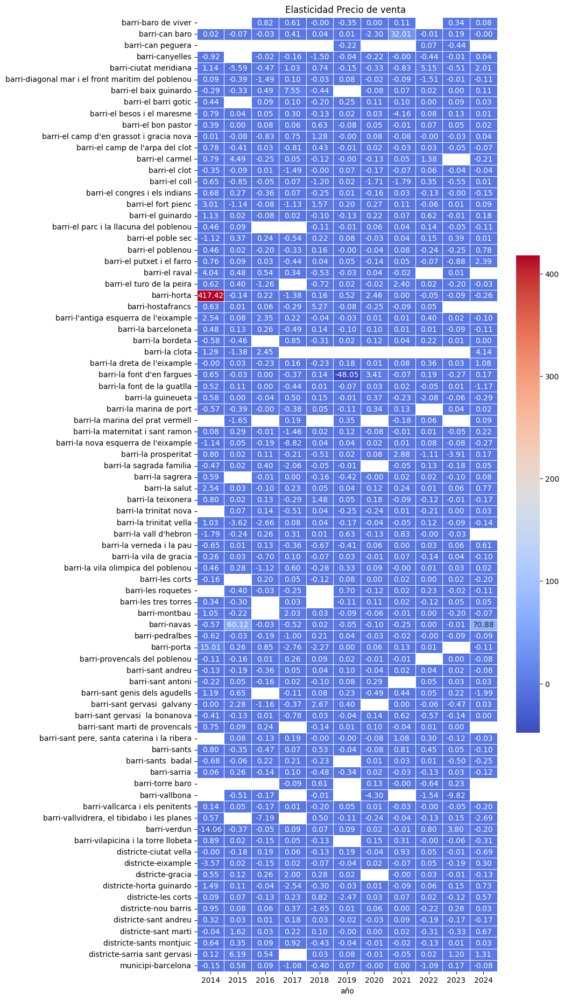

In [472]:
elasticidad = bcn_precios.copy()
elasticidad['año'] = elasticidad['mes'].dt.year

# Agrupar por año y calcular los promedios de precio y superficie
elasticidad = elasticidad.groupby(['tipo','nombre','año']).agg({
    'precio_venta': 'mean',
    'superficie_venta': 'mean'
}).reset_index()

# Calcular la tasa de variación porcentual (\(\Delta\%\))
elasticidad['delta_precio_venta'] = elasticidad['precio_venta'].pct_change()
elasticidad['delta_superficie_venta'] = elasticidad['superficie_venta'].pct_change()

# Calcular la elasticidad
elasticidad['elasticidad'] = elasticidad['delta_precio_venta'] / elasticidad['delta_superficie_venta']

gen_bcn_estats = elasticidad.groupby(['tipo','nombre']).agg({'precio_venta': 'mean','superficie_venta': 'mean','elasticidad': 'mean'}).reset_index().round(4)
gen_bcn_estats.columns = ['tipo','nombre','precio_venta_10y','superficie_venta_10y','elasticidad_10y']

gen_bcn_estats[['precio_venta_5y','superficie_venta_5y','elasticidad_5y']] = \
    elasticidad[elasticidad['año'] > max(elasticidad['año']) -5].groupby(['tipo','nombre'])\
    .agg({'precio_venta': 'mean','superficie_venta': 'mean','elasticidad': 'mean'})\
    .reset_index().round(4)[['precio_venta','superficie_venta','elasticidad']]

# display(gen_bcn_estats)
gen_bcn_estats.to_csv("datasets/gen_bcn_estats.csv", index=False)

# Limpiar resultados
elasticidad = elasticidad.dropna()  # Eliminar filas con NaN (primer año o superficies/ventas nulas)

elasticidad = elasticidad.pivot(index=['tipo','nombre'], columns='año', values='elasticidad')
# Mostrar resultados

fig = plt.figure(figsize=(9, 23))
sns.heatmap(elasticidad, annot=True, cmap='coolwarm' , linewidths=.5, cbar_kws={"shrink": .5}, fmt='.2f')
plt.title(f'Elasticidad Precio de venta ')
plt.ylabel('')
plt.show()



1. **Rentabilidad bruta de alquiler**: 
   - Fórmula: \( \text{Rentabilidad bruta} = \frac{\text{Ingreso anual por alquiler}}{\text{Precio de compra}} \times 100 \).
   - Mide cuánto porcentaje del precio de compra se recupera anualmente a través del alquiler.

,tipo,nombre,precio_alquiler,rentabilidad
0,barri,baro de viver,7.7588,0.0637
1,barri,can baro,13.9205,0.0592
2,barri,can peguera,NaN,NaN
3,barri,canyelles,9.9978,0.0573
4,barri,ciutat meridiana,9.7698,0.0673
...,...,...,...,...
79,districte,sant andreu,12.8923,0.0550
80,districte,sant marti,14.8829,0.0537
81,districte,sants montjuic,14.5744,0.0544
82,districte,sarria sant gervasi,16.7185,0.0418


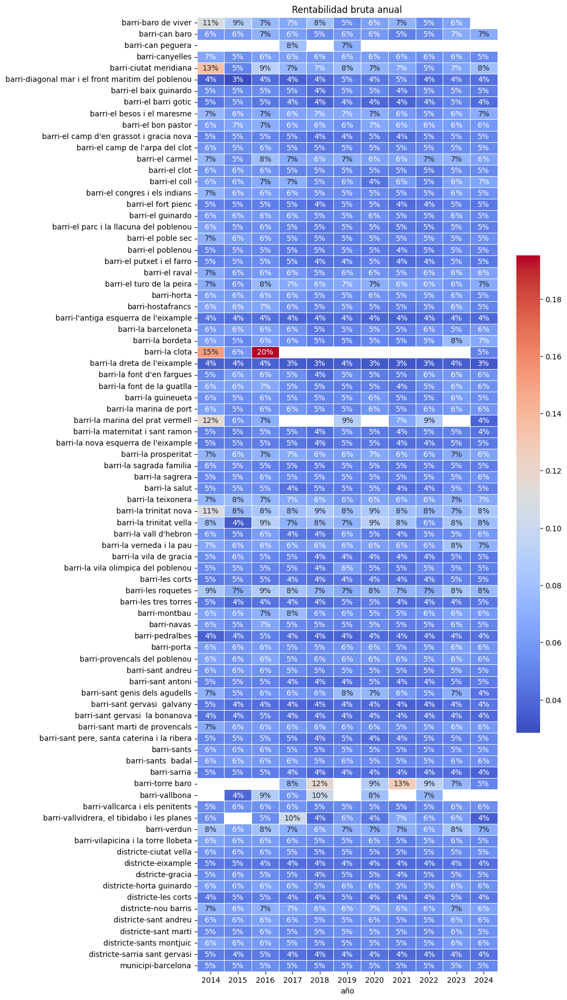

In [473]:
rentabilidad = bcn_precios.copy()
rentabilidad['año'] = rentabilidad['mes'].dt.year

# Agrupar por año y calcular los promedios de precio y superficie
rentabilidad = rentabilidad.groupby(['tipo','nombre','año']).agg({
    'precio_venta': 'mean',
    'precio_alquiler': 'mean'
}).reset_index()

# Calcular la tasa de variación porcentual (\(\Delta\%\))
rentabilidad['rentabilidad'] = rentabilidad['precio_alquiler'] * 12 / rentabilidad['precio_venta']

gen_bcn_estats[['precio_alquiler_10y', 'rentabilidad_10y']] = \
    rentabilidad.groupby(['tipo','nombre'])\
    .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
    .reset_index().round(4)[['precio_alquiler','rentabilidad']]

gen_bcn_estats[['precio_alquiler_5y', 'rentabilidad_5y']] = \
    rentabilidad[rentabilidad['año'] > max(rentabilidad['año']) -5].groupby(['tipo','nombre'])\
    .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
    .reset_index().round(4)[['precio_alquiler','rentabilidad']]

display(rentabilidad[rentabilidad['año'] > max(rentabilidad['año']) -5].groupby(['tipo','nombre'])\
    .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
    .reset_index().round(4)[['tipo','nombre','precio_alquiler','rentabilidad']])

# display(gen_bcn_estats)
gen_bcn_estats.to_csv("datasets/gen_bcn_estats.csv", index=False)

# Limpiar resultados
rentabilidad = rentabilidad.dropna()  # Eliminar filas con NaN (primer año o superficies/ventas nulas)

rentabilidad = rentabilidad.pivot(index=['tipo','nombre'], columns='año', values='rentabilidad')
# Mostrar resultados

fig = plt.figure(figsize=(9, 23))
sns.heatmap(rentabilidad, annot=True, cmap='coolwarm' , linewidths=.5, cbar_kws={"shrink": .5}, fmt='.0%')
plt.title(f'Rentabilidad bruta anual')
plt.ylabel('')
plt.show()


La **tasa de crecimiento** de `precio_alquiler` a lo largo de los meses puede calcularse utilizando las siguientes fórmulas: 

1. **Tasa de crecimiento mensual relativa**: 
   \[
   \text{Tasa de crecimiento} = \frac{\text{precio\_alquiler}_{t} - \text{precio\_alquiler}_{t-1}}{\text{precio\_alquiler}_{t-1}} \times 100
   \]
   Esto mide el cambio porcentual de un mes respecto al mes anterior.

2. **Tasa de crecimiento acumulada** (opcional): 
   Para observar el crecimiento relativo al precio inicial en el periodo de análisis, se calcula:
   \[
   \text{Crecimiento acumulado} = \frac{\text{precio\_alquiler}_{t} - \text{precio\_alquiler}_{\text{inicio}}}{\text{precio\_alquiler}_{\text{inicio}}} \times 100
   \]


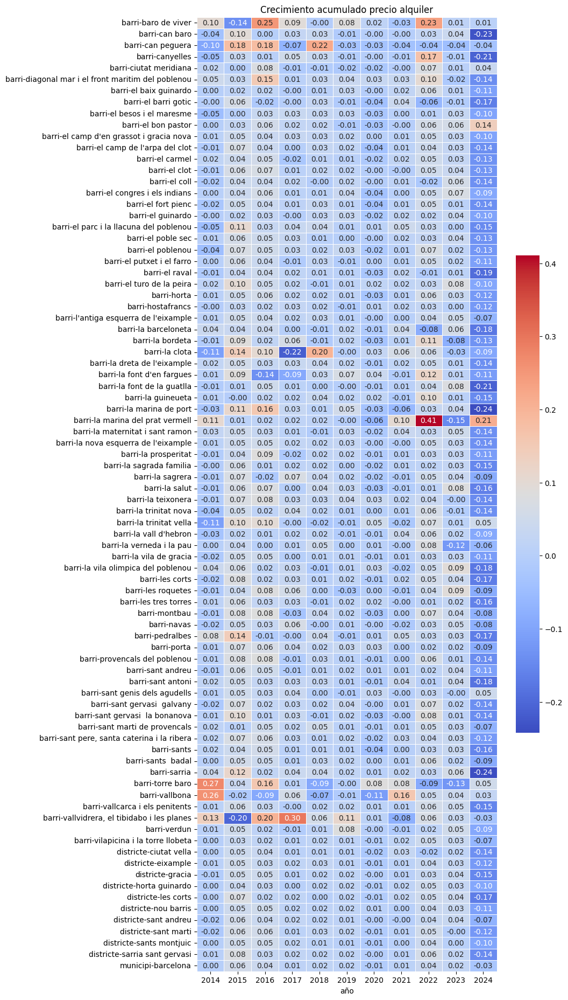

In [474]:
crecimiento = bcn_precios.interpolate().copy()
crecimiento['año'] = crecimiento['mes'].dt.year

# Agrupar por año y calcular los promedios de precio y superficie
crecimiento = crecimiento.groupby(['tipo','nombre','año']).agg({
    'precio_alquiler': ['first','mean'],
    'precio_venta': ['first','mean'],
    'superficie_venta': ['first','mean']
}).reset_index()

# Calcular la crecimiento
crecimiento['grow_acu_alquiler'] = (crecimiento['precio_alquiler']['mean'] - crecimiento['precio_alquiler']['first']) / crecimiento['precio_alquiler']['first']
crecimiento['grow_acu_venta'] = (crecimiento['precio_venta']['mean'] - crecimiento['precio_venta']['first']) / crecimiento['precio_venta']['first']
crecimiento['grow_acu_superficie_venta'] = (crecimiento['superficie_venta']['mean'] - crecimiento['superficie_venta']['first']) / crecimiento['superficie_venta']['first']

gen_bcn_estats[['grow_acu_alquiler_10y', 'grow_acu_venta_10y', 'grow_acu_superficie_venta_10y']] = \
    crecimiento.groupby(['tipo','nombre'])\
    .sum(['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta'])\
    .reset_index().round(4)[['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta']]\

gen_bcn_estats[['grow_acu_alquiler_5y', 'grow_acu_venta_5y', 'grow_acu_superficie_venta_5y']] = \
    crecimiento[crecimiento['año'] > max(crecimiento['año']) -5].groupby(['tipo','nombre'])\
    .sum(['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta'])\
    .reset_index().round(4)[['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta']]\

# display(gen_bcn_estats)
gen_bcn_estats.to_csv("datasets/gen_bcn_estats.csv", index=False)

# Limpiar resultados
crecimiento = crecimiento.dropna()  # Eliminar filas con NaN (primer año o superficies/ventas nulas)

crecimiento = crecimiento.pivot(index=['tipo','nombre'], columns='año', values='grow_acu_alquiler')
# Mostrar resultados

fig = plt.figure(figsize=(9, 23))
sns.heatmap(crecimiento, annot=True, cmap='coolwarm' , linewidths=.5, cbar_kws={"shrink": .5}, fmt='.2f')
plt.title(f'Crecimiento acumulado precio alquiler')
plt.ylabel('')
plt.show()



## Análisis de cohotes

### **Definición de las cohortes por métricas financieras**

#### **1. Cohorte: Elasticidad del precio de compra medio en los últimos 10 años (`elasticidad_10y_stars`)**
- **Definición**: 
  Esta cohorte clasifica los barrios en 5 clases según el cuartil de elasticidad del precio de compra medio. La elasticidad mide cómo responde el precio de compra de las viviendas a cambios en factores externos, como el nivel de ingresos, la oferta y demanda, o los cambios económicos. 
  - Barrios con elasticidad alta: Responden significativamente a las fluctuaciones del mercado.
  - Barrios con elasticidad baja: Presentan precios más estables.

- **Utilidad**: 
  - Identificar barrios con mayor volatilidad para inversores con mayor tolerancia al riesgo.
  - Detectar zonas con precios estables para inversiones conservadoras.
  - Analizar la sensibilidad de los barrios a cambios macroeconómicos, ayudando a prever posibles riesgos o ventajas en futuros escenarios.

---

#### **2. Cohorte: Rentabilidad de inversión media en los últimos 10 años (`rentabilidad_10y_stars`)**
- **Definición**: 
  Clasifica los barrios en 5 clases basándose en el cuartil de rentabilidad media (bruta o neta) generada por la inversión en propiedades en los últimos 10 años. La rentabilidad mide el retorno económico generado, comparando ingresos por alquiler o revalorización con el coste inicial de la inversión.

- **Utilidad**:
  - Identificar los barrios más rentables para maximizar el retorno económico.
  - Comparar la relación entre rentabilidad y riesgo (elasticidad o estabilidad de precios).
  - Evaluar la sostenibilidad de rentabilidades pasadas en el contexto actual del mercado inmobiliario.
  - Segmentar inversores según su enfoque (rentabilidad a corto plazo vs. revalorización a largo plazo).

---

#### **3. Cohorte: Crecimiento acumulado del precio de alquiler medio en los últimos 10 años (`grow_acu_alquiler_10y_stars`)**
- **Definición**: 
  Esta cohorte clasifica los barrios en 5 clases según el cuartil de crecimiento acumulado en el precio medio del m² de alquiler en la última década. El crecimiento acumulado refleja la capacidad del barrio para atraer demanda y adaptarse a cambios en el mercado de alquiler.

- **Utilidad**:
  - Identificar barrios con alta demanda de alquiler (zonas emergentes o consolidadas).
  - Evaluar oportunidades para inversión en alquiler basándose en tendencias históricas.
  - Analizar la relación entre el crecimiento del alquiler y otros indicadores (ingresos de la población, nuevas infraestructuras, etc.).
  - Diseñar estrategias de marketing o posicionamiento para propiedades en zonas de rápido crecimiento.

---

#### **4. Cohorte: Crecimiento acumulado del precio de compra medio en los últimos 10 años (`grow_acu_venta_10y_stars`)**
- **Definición**: 
  Clasifica los barrios en 5 clases basándose en el cuartil de crecimiento acumulado en el precio medio del m² de venta en los últimos 10 años. Representa la capacidad de revalorización de las propiedades en cada barrio.

- **Utilidad**:
  - Identificar barrios con alta revalorización para inversiones a largo plazo.
  - Detectar áreas en declive o con crecimiento moderado, que puedan representar oportunidades de compra a precios reducidos.
  - Evaluar la correlación entre el crecimiento del precio de venta y factores como la calidad de vida, inversiones en infraestructuras o evolución socioeconómica de la zona.
  - Prever el impacto de nuevas normativas o cambios en la dinámica del mercado en el crecimiento futuro.

---

### **Insights relevantes que se pueden extraer**
1. **Análisis de rentabilidad vs. riesgo**: 
   Comparando `elasticidad_10y_stars` con `rentabilidad_10y_stars`, es posible identificar barrios con rentabilidad alta pero riesgo bajo (ideal para inversiones conservadoras) o barrios de alta elasticidad y alta rentabilidad (para inversores agresivos).

2. **Oportunidades de crecimiento**: 
   Relacionando `grow_acu_alquiler_10y_stars` y `grow_acu_venta_10y_stars`, se pueden identificar áreas con alta demanda de alquiler y revalorización de propiedades, óptimas para inversiones mixtas (compra para alquilar y reventa).

3. **Estrategias específicas por perfil de inversor**: 
   - **Inversores a corto plazo**: Priorizar barrios con alta rentabilidad y elasticidad moderada.
   - **Inversores a largo plazo**: Enfocarse en zonas con alto crecimiento acumulado en venta y estabilidad de precios.

4. **Identificación de zonas emergentes**:
   Comparando `grow_acu_alquiler_10y_stars` y `elasticidad_10y_stars`, se pueden detectar barrios con demanda creciente y precios aún moderados, indicando potencial para revalorización futura.

5. **Impacto de factores externos**:
   Analizando cómo la elasticidad varía entre barrios, es posible prever qué áreas serán más sensibles a cambios en normativas, tasas de interés o dinámica de oferta/demanda.

6. **Clasificación competitiva de barrios**: 
   Usando las cohortes como base, es posible elaborar rankings de barrios para orientar a inversores o agentes inmobiliarios.

### **Conclusión**
Estas cohortes permiten segmentar el mercado inmobiliario de forma avanzada, ofreciendo insights útiles para optimizar decisiones de inversión, diseño de políticas públicas o estrategias comerciales. Su combinación potencia el análisis multidimensional, ajustado a distintos perfiles y objetivos. 

In [475]:
l = range(1, 6)
for field in ['elasticidad_10y', 'rentabilidad_10y', 'grow_acu_alquiler_10y', 'grow_acu_venta_10y' ]:
    gen_bcn_estats.drop(columns=[f'{field}_stars'], inplace=True, errors='ignore')
    for tipo in ['barri', 'districte', 'municipi']:
        filtered = gen_bcn_estats['tipo'] == tipo
        gen_bcn_estats.loc[filtered, f'{field}_stars'] = \
            pd.cut(gen_bcn_estats.loc[filtered, field].replace([np.inf, -np.inf], 0), bins=len(l), labels=l)#.apply(lambda x: x/10)

gen_bcn_estats.to_csv("datasets/gen_bcn_estats.csv", index=False)

bcn_precios = pd.merge(bcn_precios, gen_bcn_estats, on=['tipo','nombre'], how='left')
bcn_precios.drop(columns=bcn_precios.columns[bcn_precios.columns.str.endswith('y')], axis=1, inplace=True)


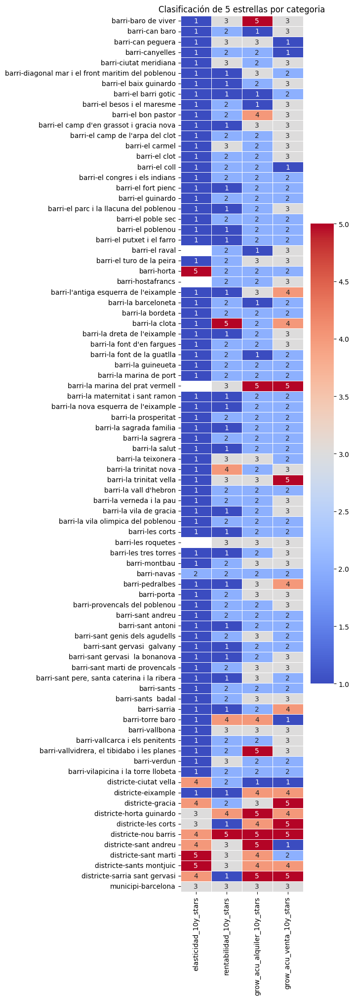

In [476]:
df = gen_bcn_estats[['tipo','nombre','elasticidad_10y_stars', 'rentabilidad_10y_stars', 'grow_acu_alquiler_10y_stars', 'grow_acu_venta_10y_stars']]
for column in ['elasticidad_10y_stars', 'rentabilidad_10y_stars', 'grow_acu_alquiler_10y_stars', 'grow_acu_venta_10y_stars']:
    df[column] = pd.to_numeric(df[column], errors='coerce')

df = df.set_index(['tipo','nombre'])

# Crear el heatmap
plt.figure(figsize=(4, 23))
sns.heatmap(df, annot=True, cmap='coolwarm', cbar=True, linewidths=0.5)
plt.title('Clasificación de 5 estrellas por categoria')
plt.ylabel('')
plt.show()

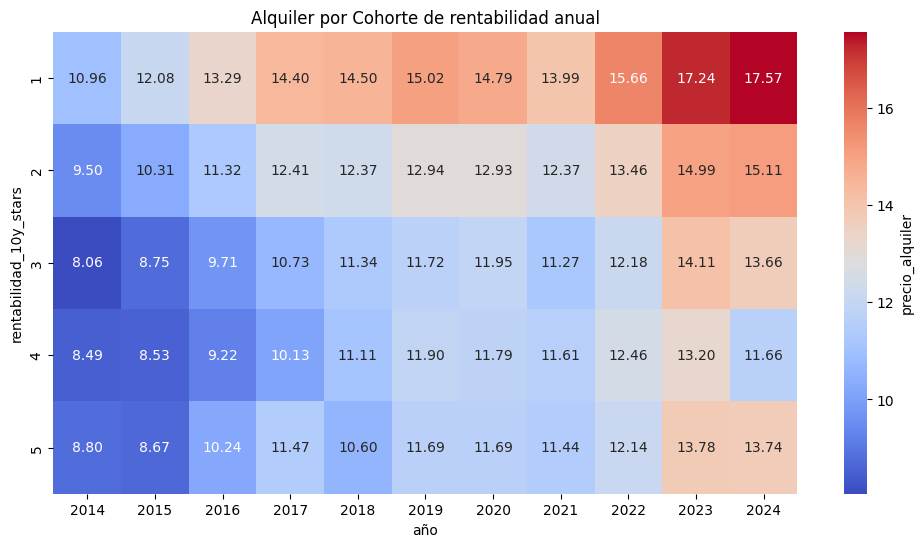

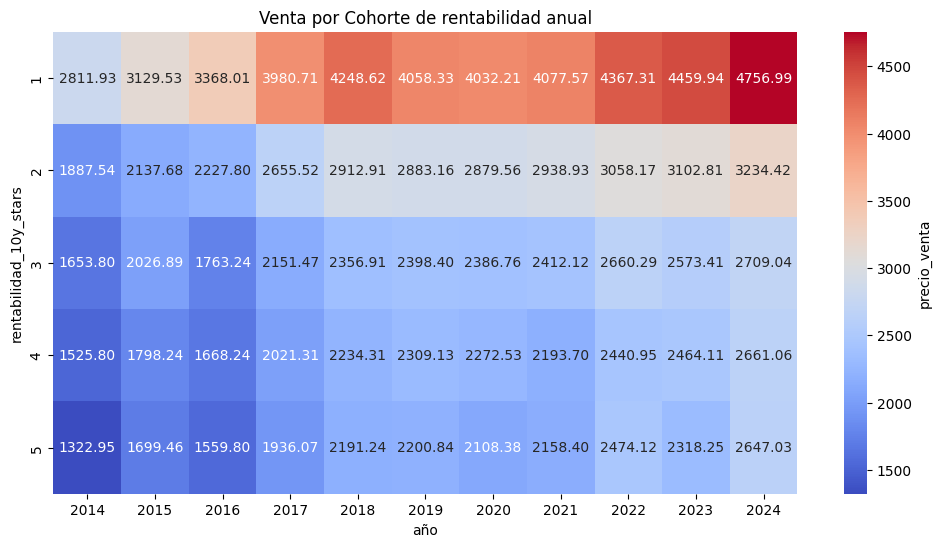

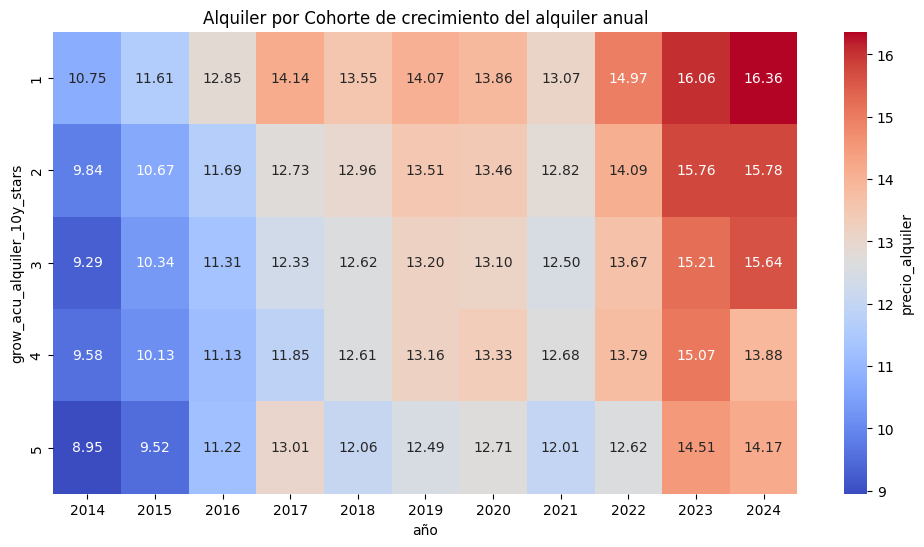

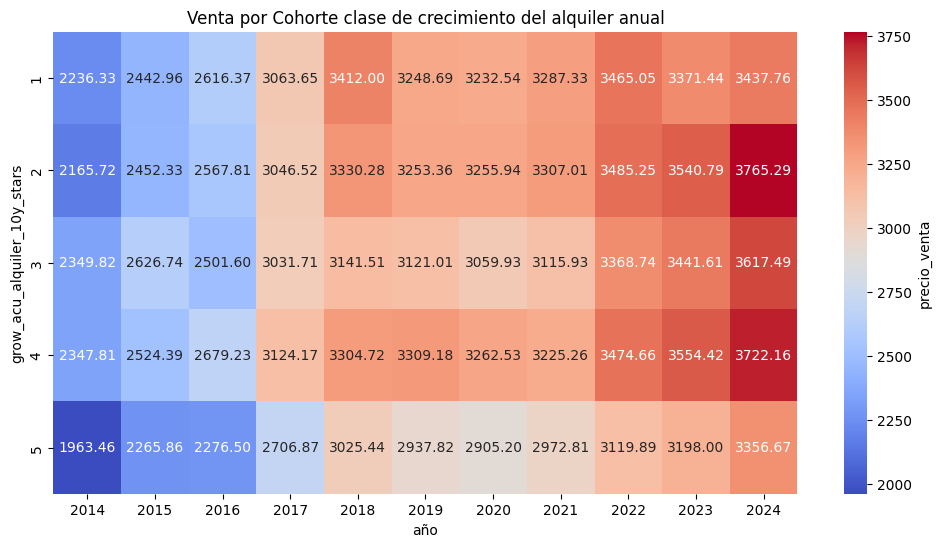

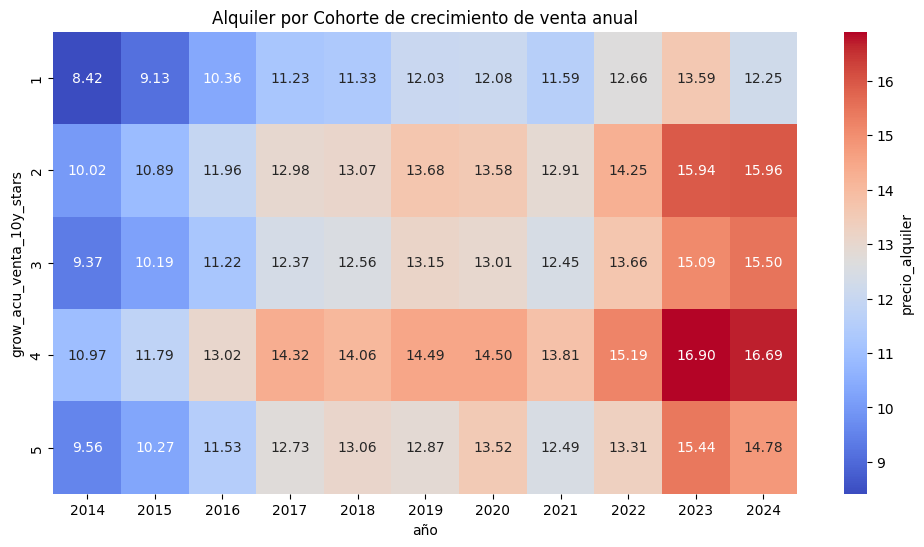

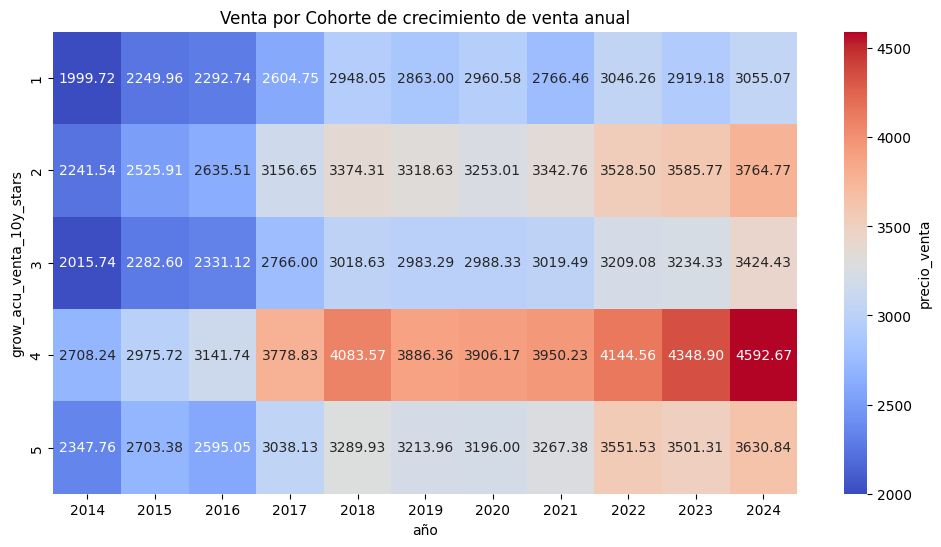

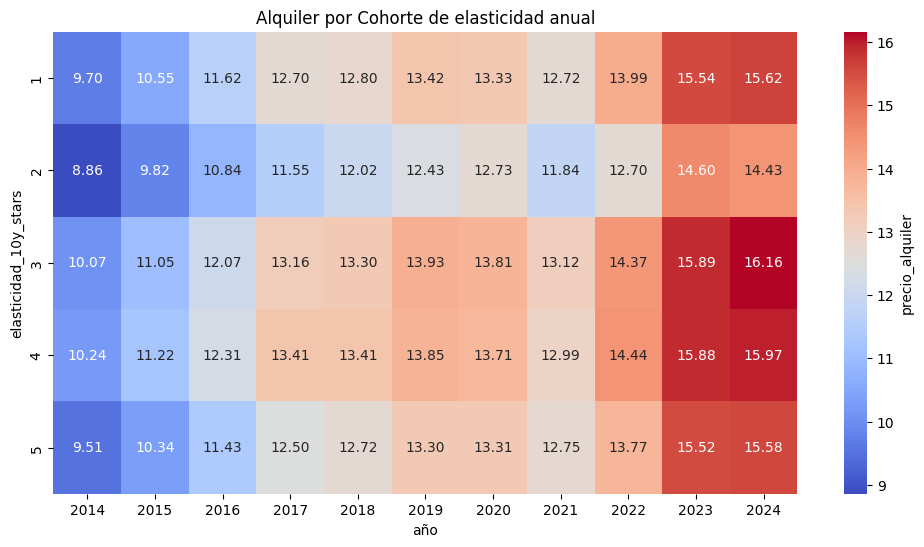

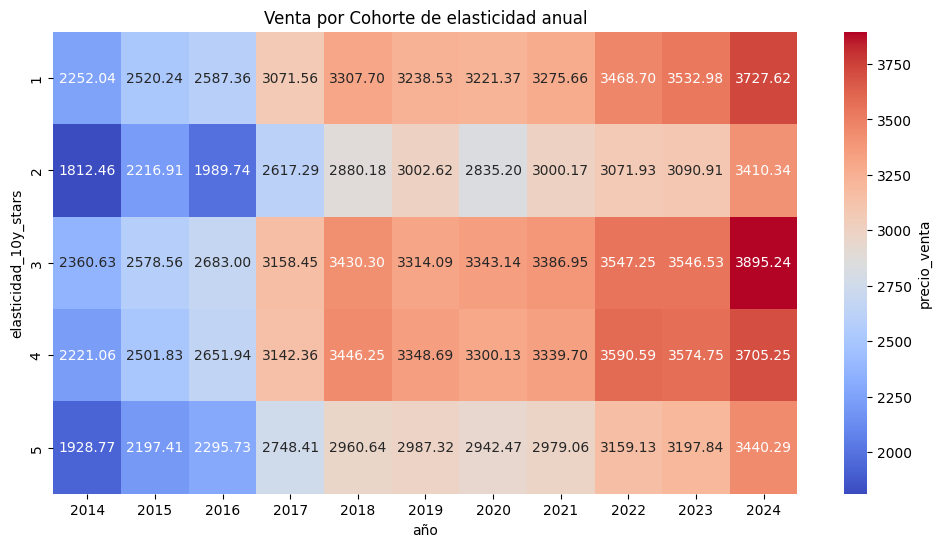

In [477]:
bcn_precios['año'] = bcn_precios['mes'].dt.year  # Extraer el año

def cohort_heatmap(df, index, columns, values, title):
    df = df.pivot_table(index=index, columns=columns, values=values)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df, annot=True, cmap='coolwarm', cbar_kws={'label': values}, fmt='.2f')
    plt.title(title)
    plt.xlabel(columns)
    plt.ylabel(index)
    plt.show()

cohort_heatmap(bcn_precios, 'rentabilidad_10y_stars', 'año', 'precio_alquiler', 'Alquiler por Cohorte de rentabilidad anual')
cohort_heatmap(bcn_precios, 'rentabilidad_10y_stars', 'año', 'precio_venta', 'Venta por Cohorte de rentabilidad anual')

cohort_heatmap(bcn_precios, 'grow_acu_alquiler_10y_stars', 'año', 'precio_alquiler', 'Alquiler por Cohorte de crecimiento del alquiler anual')
cohort_heatmap(bcn_precios, 'grow_acu_alquiler_10y_stars', 'año', 'precio_venta', 'Venta por Cohorte clase de crecimiento del alquiler anual')

cohort_heatmap(bcn_precios, 'grow_acu_venta_10y_stars', 'año', 'precio_alquiler', 'Alquiler por Cohorte de crecimiento de venta anual')
cohort_heatmap(bcn_precios, 'grow_acu_venta_10y_stars', 'año', 'precio_venta', 'Venta por Cohorte de crecimiento de venta anual')

cohort_heatmap(bcn_precios, 'elasticidad_10y_stars', 'año', 'precio_alquiler', 'Alquiler por Cohorte de elasticidad anual')
cohort_heatmap(bcn_precios, 'elasticidad_10y_stars', 'año', 'precio_venta', 'Venta por Cohorte de elasticidad anual')


### **Descripción de la cohorte `cohortes_distrito`**

La cohorte `cohortes_distrito` se genera a partir de los datos del dataset agrupados por **distrito** (`codi_districte`) y **año** (`año`), con el objetivo de analizar las tendencias de los precios de alquiler y venta en diferentes distritos de Barcelona a lo largo del tiempo.

#### **Estructura de la cohorte `cohortes_distrito`**

1. **Identificador de cohorte**: La cohorte se define como la combinación del `codi_districte` (que representa el distrito de la ciudad) y el `año` de la fecha del dato (`mes` transformado en año). Así, cada fila del DataFrame representa un distrito y el año de las mediciones de precios, lo que permite observar cómo han evolucionado los precios de alquiler y venta en ese distrito a lo largo del tiempo.
   
   - **Cohorte**: `cohorte_distrito = codi_districte + '-' + año`

2. **Variables principales**:
   - **`alquiler_medio`**: Precio medio de alquiler en ese distrito y año.
   - **`venta_media`**: Precio medio de venta en ese distrito y año.
   - **`codi_districte`**: Código del distrito, que se usa para identificar el área específica de Barcelona.
   - **`año`**: El año de la medición, extraído de la columna `mes`.

#### **Ejemplo de una fila en `cohortes_distrito`**:

| cohorte_distrito | alquiler_medio | venta_media | codi_districte | año |
|------------------|----------------|-------------|----------------|-----|
| 9-2014           | 3.92           | 438.5       | 9              | 2014|
| 9-2015           | 4.10           | 450.0       | 9              | 2015|
| 9-2016           | 4.05           | 460.0       | 9              | 2016|

En este ejemplo:
- El distrito con `codi_districte = 9` (Sant Andreu) se agrupa en las cohortes correspondientes a los años 2014, 2015 y 2016. Se calcula el precio medio de alquiler y venta en ese distrito para cada uno de esos años.

### **Justificación de la cohorte `cohortes_distrito`**

1. **Análisis geográfico a nivel distrital**:
   - **Diferencias regionales**: Los distritos de Barcelona suelen presentar características socioeconómicas distintas. Algunos pueden ser más turísticos, otros más residenciales o comerciales, lo que afecta tanto a la oferta como a la demanda de propiedades. Al crear una cohorte basada en el distrito y año, se puede observar cómo evoluciona el mercado de precios en diferentes áreas de la ciudad.
   - **Estabilidad local**: El análisis de los precios por distrito permite observar si ciertas zonas experimentan una estabilidad o fluctuaciones a lo largo del tiempo, lo que puede ser valioso para inversores, planificadores urbanos y ciudadanos interesados en las tendencias inmobiliarias.

2. **Evolución temporal de los precios**:
   - Al agrupar los datos por año, es posible identificar si los precios de alquiler y venta en un distrito aumentan, disminuyen o permanecen estables a lo largo del tiempo. Esto puede reflejar factores como la gentrificación, cambios en la infraestructura, o políticas urbanísticas locales.
   - **Estacionalidad**: Además de observar las tendencias anuales, esta cohorte podría ser útil para detectar patrones estacionales si se desglosara aún más en base a meses o trimestres.

3. **Impacto de factores externos**:
   - Las variaciones de los precios en los distritos podrían estar influenciadas por eventos o decisiones fuera del control de los individuos, como el desarrollo de infraestructuras, cambios en las leyes de arrendamiento, o proyectos urbanísticos. Esta cohorte ayuda a estudiar cómo esos factores afectan a cada distrito de manera distinta.

4. **Segmentación para análisis detallados**:
   - La cohorte por distrito permite realizar un análisis más granular, lo que facilita la toma de decisiones específicas para cada zona. Por ejemplo, si un distrito muestra un aumento considerable en los precios, podría ser un indicativo de que la zona está siendo más demandada o que está pasando por un proceso de renovación o desarrollo.
   - Las políticas urbanísticas o el desarrollo económico podrían ser analizados en función de cómo afectan a los diferentes distritos. Si el distrito con un alto índice de precios sube significativamente, se podría investigar si el área está siendo renovada o si tiene un crecimiento económico.

### **Conclusión**
La cohorte `cohortes_distrito` es valiosa porque permite hacer un análisis detallado de la evolución de los precios inmobiliarios en Barcelona, proporcionando información útil tanto para analistas de datos como para los responsables de la toma de decisiones en planificación urbana, inversión inmobiliaria y desarrollo económico.

In [478]:

# Crear columnas adicionales para cohortes
bcn_precios['cohorte_distrito'] = bcn_precios['nom_districte'] + '-' + bcn_precios['año'].astype(str)  # Cohorte distrito-año
bcn_precios['cohorte_barrio'] = bcn_precios[bcn_precios['tipo'] == 'barri']['nombre'] + '-' + bcn_precios['año'].astype(str)  # Cohorte barrio-año

# Cálculo de métricas por cohorte
cohortes_distrito = bcn_precios.groupby('cohorte_distrito').agg({
    'precio_alquiler': 'mean',
    'precio_venta': 'mean',
    'nom_districte': 'first',  # Opcional: mantener información adicional
    'año': 'first'  # Año para referencias
}).reset_index()

cohortes_barrio = bcn_precios.groupby('cohorte_barrio').agg({
    'precio_alquiler': 'mean',
    'precio_venta': 'mean',
    'nombre': 'first',  # Opcional: mantener información adicional
    'año': 'first'
}).reset_index()

# Opcional: Renombrar columnas para claridad
cohortes_distrito.rename(columns={
    'precio_alquiler': 'alquiler_medio',
    'precio_venta': 'venta_media'
}, inplace=True)

cohortes_barrio.rename(columns={
    'precio_alquiler': 'alquiler_medio',
    'precio_venta': 'venta_media'
}, inplace=True)

display("Cohortes por distrito:", cohortes_distrito)
display("Cohortes por barrio:", cohortes_barrio)


'Cohortes por distrito:'

,cohorte_distrito,alquiler_medio,venta_media,nom_districte,año
0,ciutat vella-2014,11.771694,2550.350862,ciutat vella,2014
1,ciutat vella-2015,12.854582,2782.686544,ciutat vella,2015
2,ciutat vella-2016,14.358238,3153.632160,ciutat vella,2016
3,ciutat vella-2017,15.855594,3690.912594,ciutat vella,2017
4,ciutat vella-2018,14.866027,4020.173417,ciutat vella,2018
...,...,...,...,...,...
105,sarria sant gervasi-2020,15.359472,4360.535097,sarria sant gervasi,2020
106,sarria sant gervasi-2021,14.990403,4530.758239,sarria sant gervasi,2021
107,sarria sant gervasi-2022,16.313313,4813.365867,sarria sant gervasi,2022
108,sarria sant gervasi-2023,17.932306,5026.527682,sarria sant gervasi,2023


'Cohortes por barrio:'

,cohorte_barrio,alquiler_medio,venta_media,nombre,año
0,baro de viver-2014,3.975000,438.500000,baro de viver,2014
1,baro de viver-2015,4.700881,634.307692,baro de viver,2015
2,baro de viver-2016,3.598572,576.595238,baro de viver,2016
3,baro de viver-2017,6.210010,1124.352941,baro de viver,2017
4,baro de viver-2018,7.538529,1121.800000,baro de viver,2018
...,...,...,...,...,...
798,vilapicina i la torre llobeta-2020,12.286860,2622.688569,vilapicina i la torre llobeta,2020
799,vilapicina i la torre llobeta-2021,11.579680,2869.053278,vilapicina i la torre llobeta,2021
800,vilapicina i la torre llobeta-2022,12.824563,2848.928197,vilapicina i la torre llobeta,2022
801,vilapicina i la torre llobeta-2023,13.755963,2992.058329,vilapicina i la torre llobeta,2023


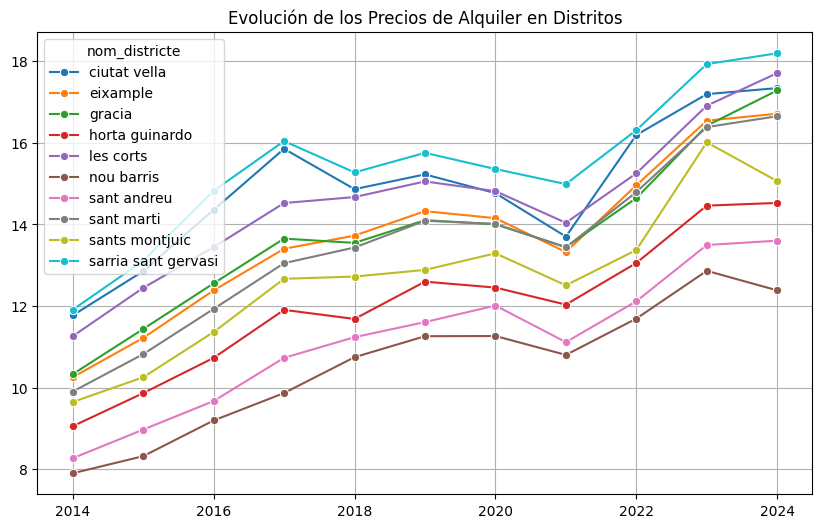

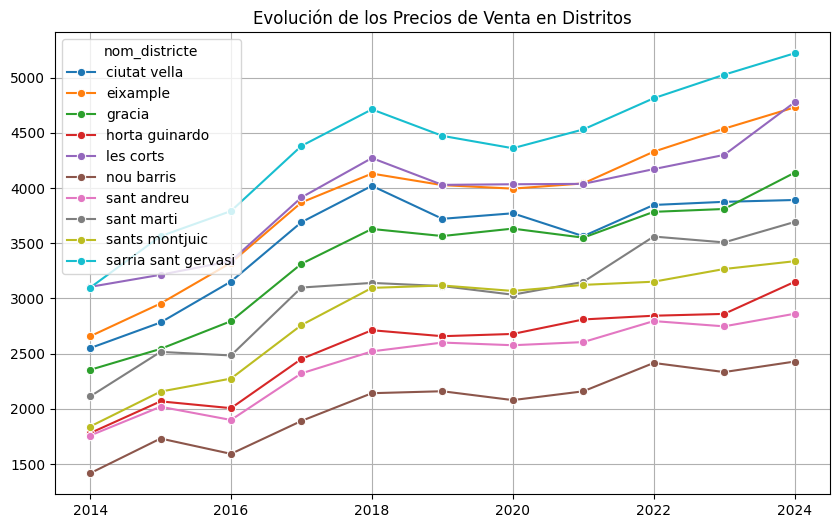

In [479]:
# Filtrar para los primeros distritos (ejemplo)
cohortes_distrito_9 = cohortes_distrito[cohortes_distrito['nom_districte'] == 'sant andreu']

plt.figure(figsize=(10, 6))
sns.lineplot(data=cohortes_distrito, x='año', y='alquiler_medio', marker='o', hue='nom_districte')
plt.title("Evolución de los Precios de Alquiler en Distritos")
plt.xlabel("")
plt.ylabel("")
# plt.yscale('log')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(data=cohortes_distrito, x='año', y='venta_media', marker='o', hue='nom_districte')
plt.title("Evolución de los Precios de Venta en Distritos")
plt.xlabel("")
plt.ylabel("")
# plt.yscale('log')
plt.grid(True)
plt.show()


<Figure size 1000x600 with 0 Axes>

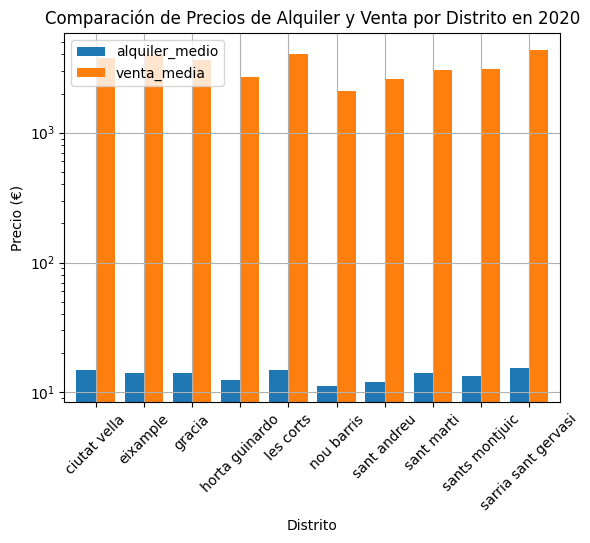

In [480]:
# Filtrar los datos para el año 2020 (por ejemplo)
cohortes_distrito_2020 = cohortes_distrito[cohortes_distrito['año'] == 2020]

plt.figure(figsize=(10, 6))
cohortes_distrito_2020.set_index('nom_districte')[['alquiler_medio', 'venta_media']].plot(kind='bar', width=0.8, logy=True)

plt.title("Comparación de Precios de Alquiler y Venta por Distrito en 2020")
plt.xlabel("Distrito")
plt.ylabel("Precio (€)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


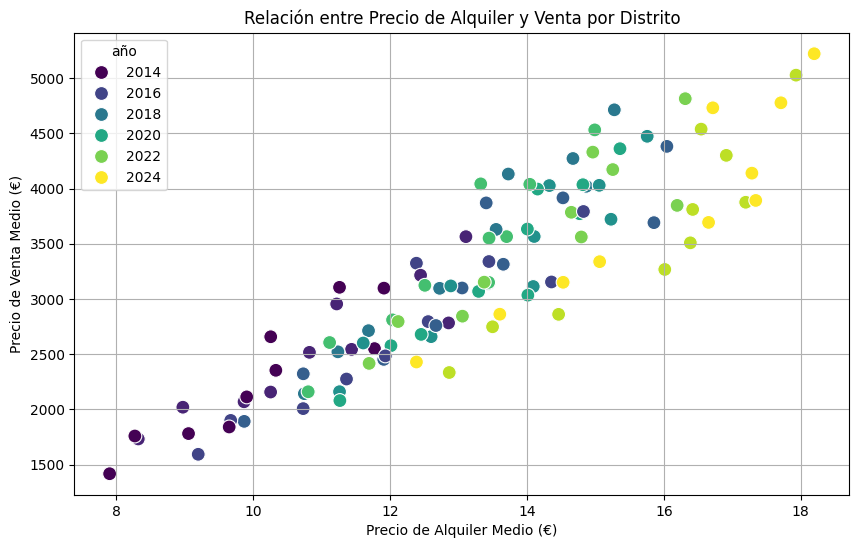

In [481]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cohortes_distrito, x='alquiler_medio', y='venta_media', hue='año', palette='viridis', s=100, marker='o')

plt.title("Relación entre Precio de Alquiler y Venta por Distrito")
plt.xlabel("Precio de Alquiler Medio (€)")
plt.ylabel("Precio de Venta Medio (€)")
plt.grid(True)
plt.show()


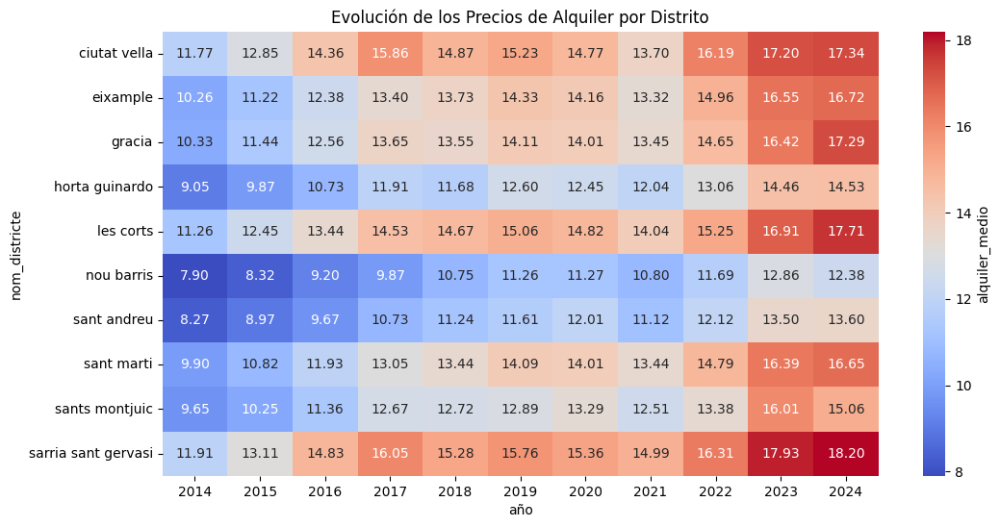

In [482]:

cohort_heatmap(cohortes_distrito, 'nom_districte', 'año', 'alquiler_medio', 'Evolución de los Precios de Alquiler por Distrito')


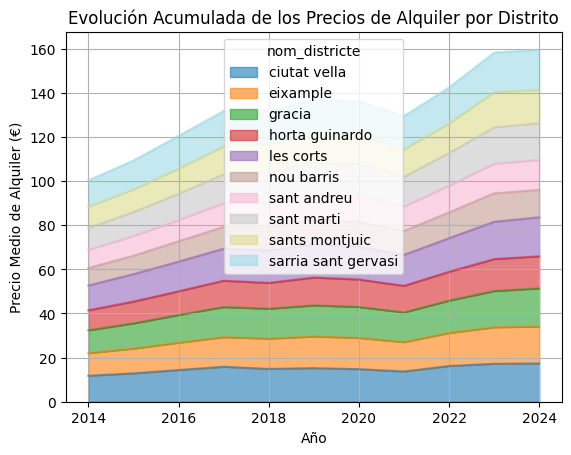

In [483]:
cohortes_distrito_pivot = cohortes_distrito.pivot_table(index='año', columns='nom_districte', values='alquiler_medio')

# fig = plt.figure(figsize=(16, 5))
cohortes_distrito_pivot.plot(kind='area', stacked=True, colormap='tab20', alpha=0.6)

plt.title("Evolución Acumulada de los Precios de Alquiler por Distrito")
plt.xlabel("Año")
plt.ylabel("Precio Medio de Alquiler (€)")
# fig.legend(title="Distrito", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


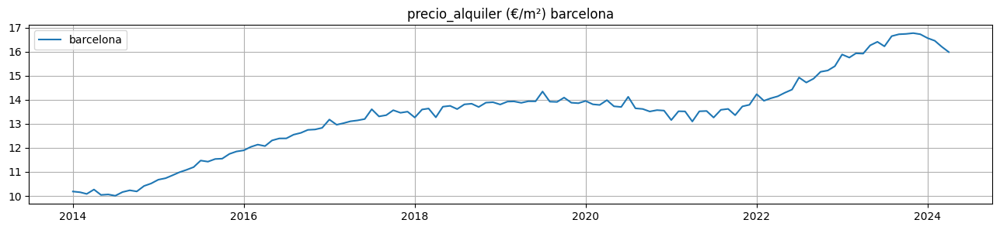

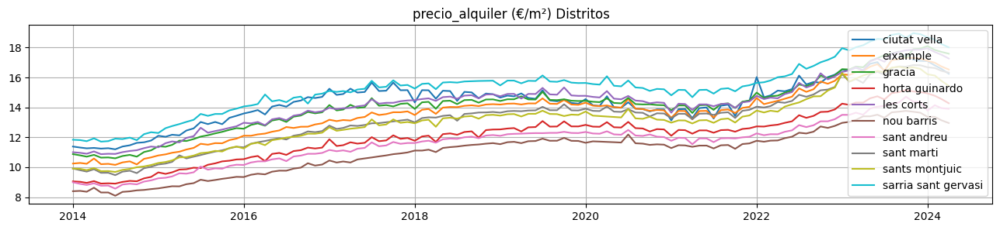

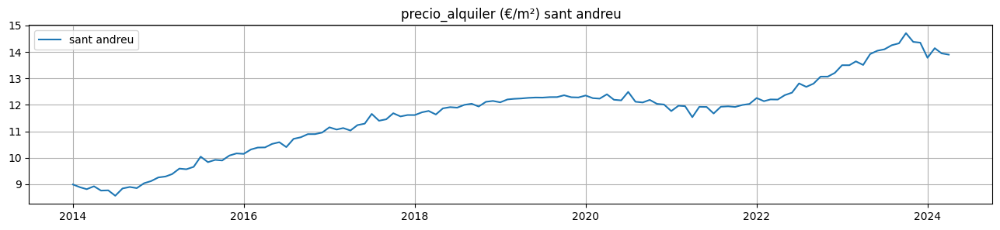

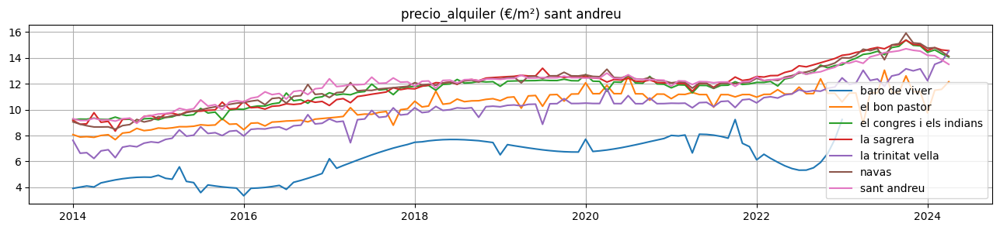

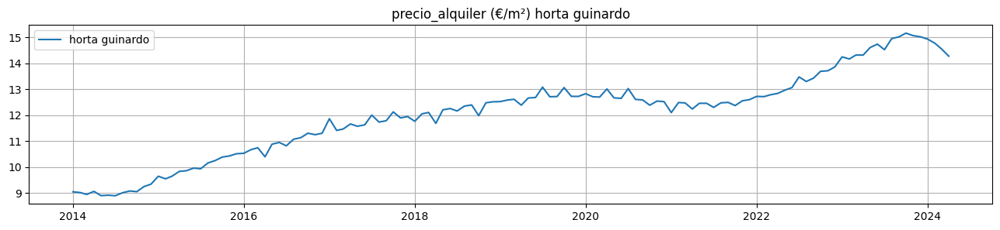

...

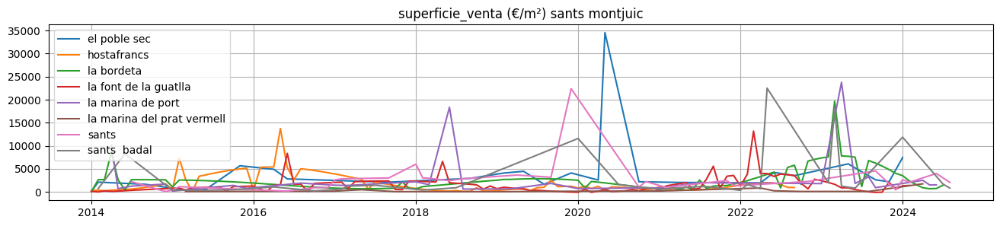

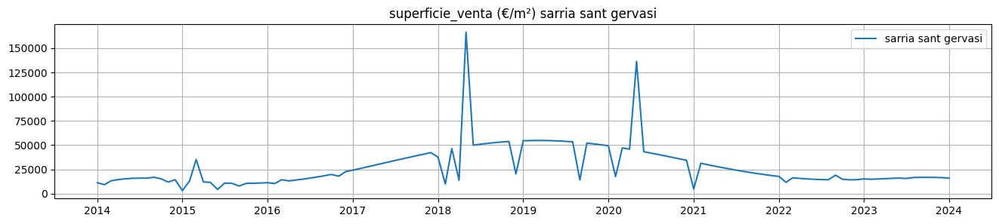

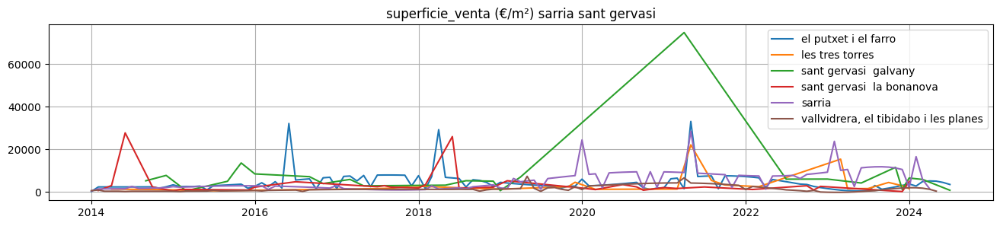

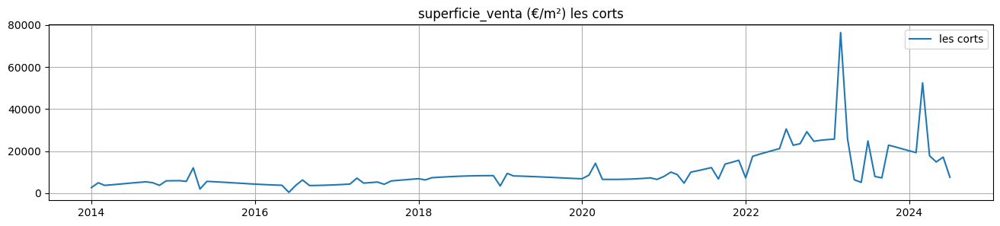

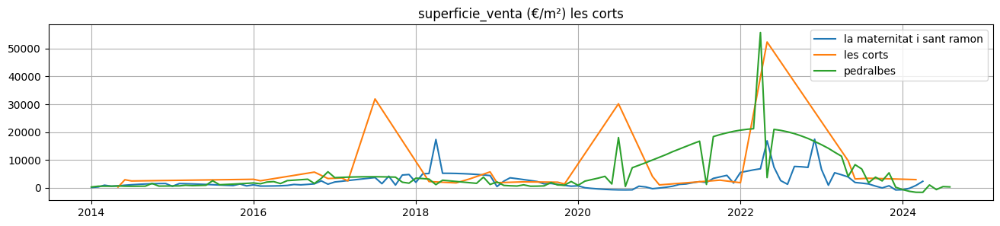

In [484]:
def plot_dist(df, field, figsize=(16, 4), title='', model=None):
    fig = plt.figure(figsize=figsize)
    for c in df['nombre'].unique():
        # sns.scatterplot(x='mes', y=field, data=df[df['nombre'] == c], markers='.')
        sns.lineplot(x='mes', y=field, data=df[df['nombre'] == c], label=c)
        plt.title(f'{field} (€/m²) '+title)
    plt.grid(True)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()


for field in ['precio_alquiler', 'precio_venta', 'superficie_venta']:
    plot_dist(bcn_precios_int[bcn_precios_int['nombre'] == 'barcelona'], field,figsize=(16,3), title='barcelona')
    plot_dist(bcn_precios_int[bcn_precios_int['tipo'] == 'districte'], field,figsize=(16,3), title='Distritos')

    for dist in bcn_precios_int['nom_districte'].dropna().unique().tolist():
        plot_dist(bcn_precios_int[(bcn_precios_int['nom_districte'] == dist) & (bcn_precios_int['tipo'] == 'districte')], field,figsize=(16,3), title=dist)
        plot_dist(bcn_precios_int[(bcn_precios_int['nom_districte'] == dist) & (bcn_precios_int['tipo'] == 'barri')], field,figsize=(16,3), title=dist)


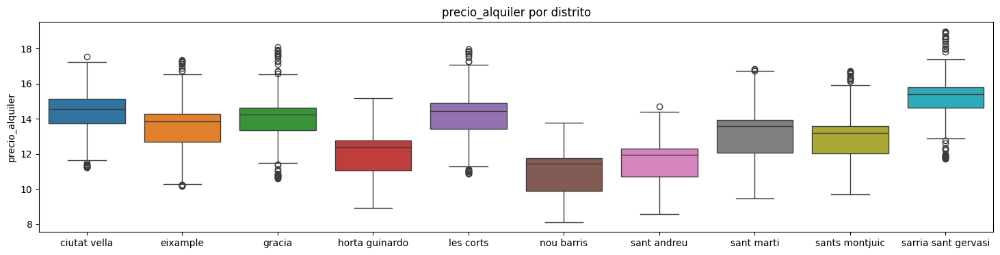

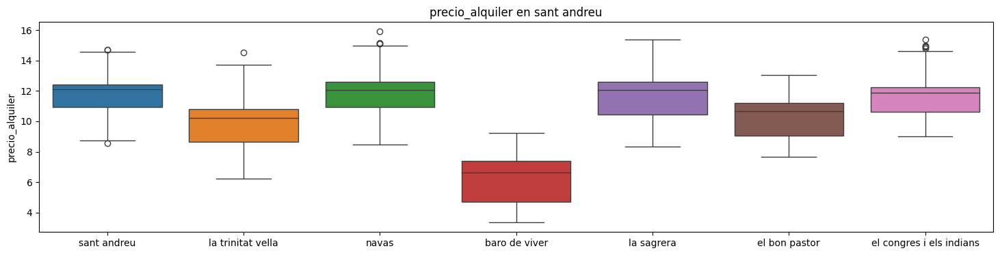

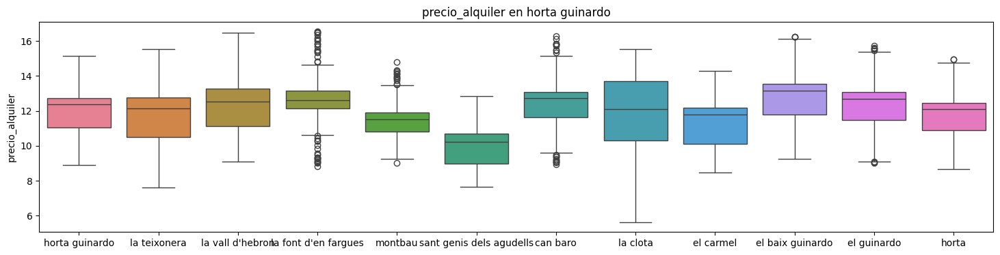

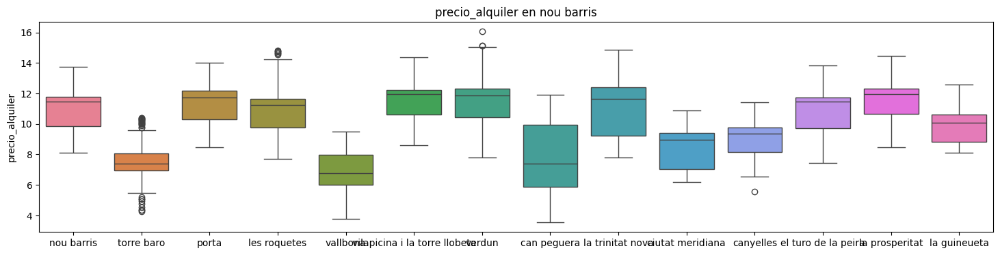

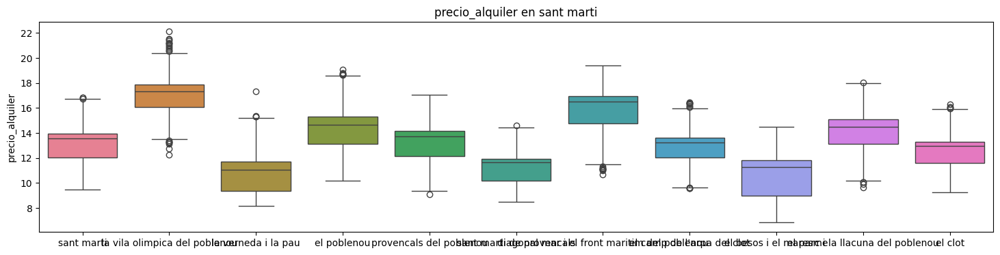

...

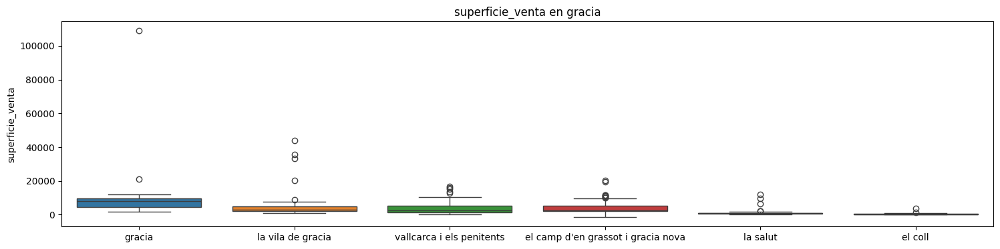

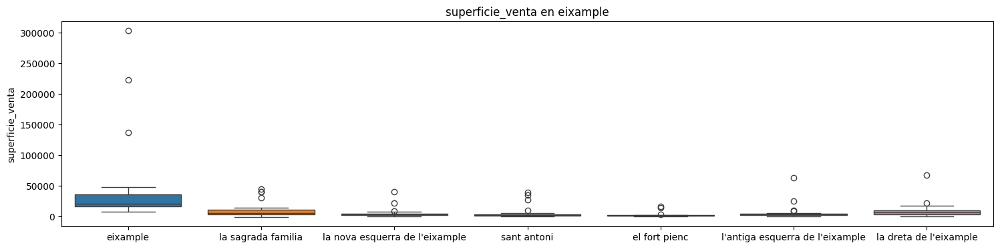

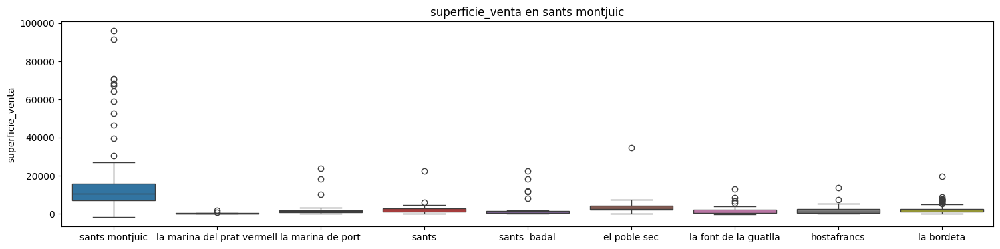

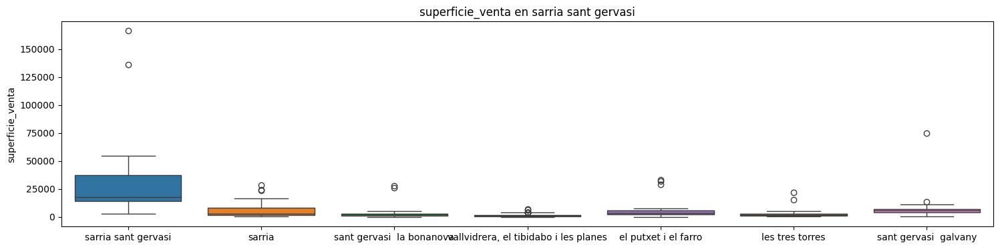

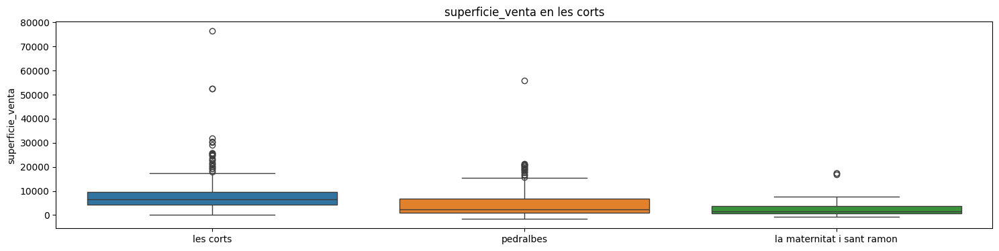

In [485]:
for field in ['precio_alquiler', 'precio_venta', 'superficie_venta']:
    fig = plt.figure(figsize=(18, 4))
    sns.boxplot(bcn_precios_int[bcn_precios_int['tipo'] == 'districte'], x='nombre', y=field, hue='nombre')
    plt.xlabel("")
    plt.title(f'{field} por distrito')
    plt.show()


    for dist in bcn_precios_int['nom_districte'].dropna().unique().tolist():
        fig = plt.figure(figsize=(18, 4))
        sns.boxplot(bcn_precios_int[bcn_precios_int['nom_districte'] == dist].sort_values(by='tipo', ascending=False), x='nombre', y=field, hue='nombre')
        plt.xlabel("")
        plt.title(f'{field} en {dist}')
        plt.show()


# for y in ['precio_alquiler', 'precio_venta']:
#     fig = plt.figure(figsize=(16, 4))
#     sns.boxplot(bcn_precios[bcn_precios['tipo'] == 'districte'], x='nombre', y=y, hue='nombre')
#     plt.xlabel("")
#     plt.title(f'{y} (€/m²) por distrito')
#     plt.show()


# for dist in bcn_precios['nom_districte'].dropna().unique().tolist():
#     for y in ['precio_alquiler', 'precio_venta']:
        # fig = plt.figure(figsize=(16, 4))
        # sns.boxplot(bcn_precios[(bcn_precios_int['nom_districte'] == dist) & (bcn_precios_int['tipo'] == 'barri')], x='nombre', y=y, hue='nombre')
        # plt.xlabel("")
        # plt.title(f'{y} (€/m²) por barrio en {dist}')
        # plt.show()


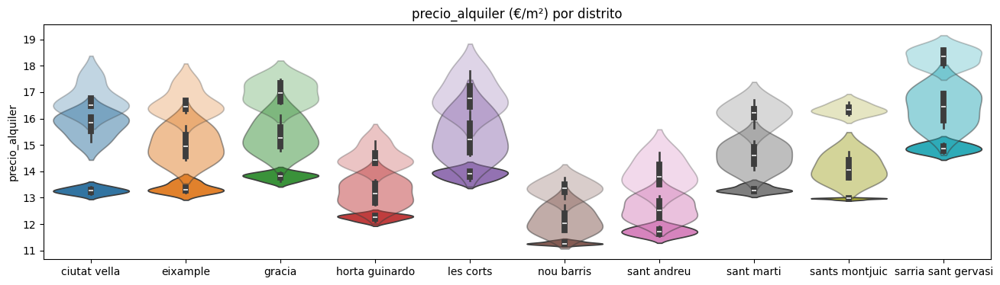

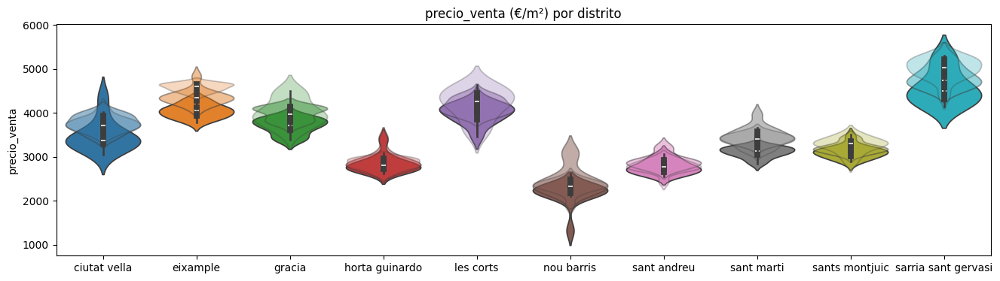

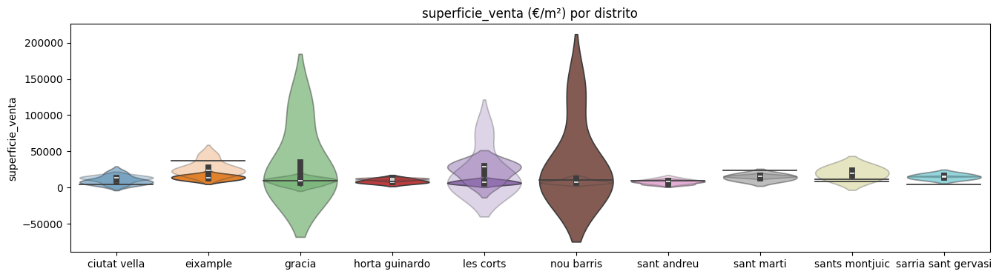

In [486]:
for y in ['precio_alquiler', 'precio_venta','superficie_venta']:
    fig = plt.figure(figsize=(16, 4))
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2021)], x='nombre', y=y, hue='nombre', split=False)
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2022)], x='nombre', y=y, hue='nombre', split=False, alpha=0.5)
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2023)], x='nombre', y=y, hue='nombre', split=False, alpha=0.3)
    plt.xlabel("")
    plt.title(f'{y} (€/m²) por distrito')
    plt.show()

In [487]:
bcn_precios

,tipo,nombre,mes,precio_alquiler,precio_venta,superficie_venta,codi_districte,nom_districte,codi_barri,elasticidad_10y_stars,rentabilidad_10y_stars,grow_acu_alquiler_10y_stars,grow_acu_venta_10y_stars,año,cohorte_distrito,cohorte_barrio
0,barri,baro de viver,2014-01-01 00:00:00+00:00,3.92,438.500000,92.0,9,sant andreu,58,1,3,5,3,2014,sant andreu-2014,baro de viver-2014
1,barri,baro de viver,2014-02-01 00:00:00+00:00,NaN,NaN,NaN,9,sant andreu,58,1,3,5,3,2014,sant andreu-2014,baro de viver-2014
2,barri,baro de viver,2014-03-01 00:00:00+00:00,NaN,NaN,56.0,9,sant andreu,58,1,3,5,3,2014,sant andreu-2014,baro de viver-2014
3,barri,baro de viver,2014-04-01 00:00:00+00:00,4.03,NaN,NaN,9,sant andreu,58,1,3,5,3,2014,sant andreu-2014,baro de viver-2014
4,barri,baro de viver,2014-05-01 00:00:00+00:00,NaN,NaN,NaN,9,sant andreu,58,1,3,5,3,2014,sant andreu-2014,baro de viver-2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10960,municipi,barcelona,2024-05-01 00:00:00+00:00,NaN,3792.943830,NaN,-1,NaN,-1,3,3,3,3,2024,NaN,NaN
10961,municipi,barcelona,2024-06-01 00:00:00+00:00,NaN,3845.827810,122345.0,-1,NaN,-1,3,3,3,3,2024,NaN,NaN
10962,municipi,barcelona,2024-07-01 00:00:00+00:00,NaN,3835.180837,NaN,-1,NaN,-1,3,3,3,3,2024,NaN,NaN
10963,municipi,barcelona,2024-08-01 00:00:00+00:00,NaN,3832.821747,NaN,-1,NaN,-1,3,3,3,3,2024,NaN,NaN


In [488]:
bcn_precios_barri = bcn_precios[bcn_precios['tipo'] == 'barri' ].drop('tipo', axis=1).copy()
bcn_precios_dist = bcn_precios[bcn_precios['tipo'] == 'districte' ].drop('tipo', axis=1).copy()
bcn_precios_muni = bcn_precios[bcn_precios['tipo'] == 'municipi' ].drop('tipo', axis=1).copy()

bcn_precios_dist


hood_qtr = bcn_precios_barri.dropna().pivot(index='nombre', columns='mes', values='precio_alquiler').reset_index()
dist_qtr = bcn_precios_dist.dropna().pivot(index='nombre', columns='mes', values='precio_alquiler').reset_index()
town_qtr = bcn_precios_muni.dropna().pivot(index='nombre', columns='mes', values='precio_alquiler').reset_index()

display(dist_qtr[dist_qtr['nombre'] == 'ciutat vella'].round(2).reset_index(drop=True))
display(hood_qtr[hood_qtr['nombre'].isin(bcn_precios[bcn_precios['nom_districte'] == 'ciutat vella']['nombre'])].round(2).reset_index(drop=True))

mes,nombre


mes,nombre,2014-01-01 00:00:00+00:00,2014-04-01 00:00:00+00:00,2014-07-01 00:00:00+00:00,2014-10-01 00:00:00+00:00,2015-01-01 00:00:00+00:00,2015-04-01 00:00:00+00:00,2015-07-01 00:00:00+00:00,2015-10-01 00:00:00+00:00,2016-01-01 00:00:00+00:00,...,2022-01-01 00:00:00+00:00,2022-04-01 00:00:00+00:00,2022-07-01 00:00:00+00:00,2022-10-01 00:00:00+00:00,2023-01-01 00:00:00+00:00,2023-04-01 00:00:00+00:00,2023-07-01 00:00:00+00:00,2023-10-01 00:00:00+00:00,2024-01-01 00:00:00+00:00,2024-04-01 00:00:00+00:00
0,el barri gotic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.26,...,16.44,NaN,NaN,NaN,16.53,NaN,NaN,NaN,16.17,NaN
1,la barceloneta,14.78,NaN,NaN,16.14,16.0,NaN,NaN,16.66,NaN,...,20.03,NaN,NaN,NaN,18.47,18.3,NaN,NaN,21.31,NaN
2,"sant pere, santa caterina i la ribera",NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.43,13.52,...,15.68,NaN,NaN,16.11,NaN,NaN,NaN,17.9,17.59,17.68


In [489]:
import re
ideal = pd.read_csv('datasets/idealista_datafile.csv')
ideal.head()


,link,type_v,address,town,price,price_old,info,description,tags,agent,created
0,/inmueble/106596114/,Piso,"Ciutat Meridiana - Torre Baró - Vallbona, Barc...","Ciutat Meridiana - Torre Baró - Vallbona, Barc...",69.875,NaN,"['2 hab.', '54 m²', 'Planta 5ª exterior sin as...","<p class=""ellipsis"">INMUEBLE SIN POSESION / VI...",NaN,NaN,2024-11-20 14:42:36
1,/inmueble/106592827/,Piso,"calle del Pare Manjón, La Trinitat Vella, Barc...","calle del Pare Manjón, La Trinitat Vella, Barc...",69.000,NaN,"['3 hab.', '41 m²', 'Planta -1 sin ascensor']","<p class=""ellipsis"">Oportunidad sólo para inve...",NaN,NaN,2024-11-20 14:42:36
2,/inmueble/106590362/,Piso,"calle de Vidal i Guasch, Les Roquetes, Barcelona","calle de Vidal i Guasch, Les Roquetes, Barcelona",95.000,NaN,"['2 hab.', '65 m²', 'Planta 1ª exterior sin as...","<p class=""ellipsis"">Housfy vende piso alquilad...",NaN,NaN,2024-11-20 14:42:36
3,/inmueble/106586185/,Piso,"calle de Palerm, 6, El Besòs, Barcelona","calle de Palerm, 6, El Besòs, Barcelona",88.500,NaN,"['3 hab.', '54 m²', 'Planta 2ª interior con as...","<p class=""ellipsis"">Inmueble ocupado ideal par...",Ocupada ilegalmente,NaN,2024-11-20 14:42:36
4,/inmueble/106585942/,Piso,"calle de Vallcivera, 22, Ciutat Meridiana - To...","calle de Vallcivera, 22, Ciutat Meridiana - To...",95.200,NaN,"['3 hab.', '66 m²', 'Planta 2ª interior con as...","<p class=""ellipsis"">Inmueble ocupado ideal par...",Ocupada ilegalmente,NaN,2024-11-20 14:42:36


In [490]:

hab_rx = re.compile(r'\'(\d+?) hab\.\'')
m2_rx = re.compile(r'\'(\d+?) m²\'')
barrio_rx = re.compile(r"([^,]+),[^,]+$")

def get_hood(x):
    x1 = ''.join(barrio_rx.findall(x)).strip() 
    x1 = x1 if len(x1)>1 else x
    return estandarizar(x1)

ideal['n_hab'] = ideal['info'].map(lambda x: ''.join(hab_rx.findall(x)))
ideal['sup_m2'] = ideal['info'].map(lambda x: ''.join(m2_rx.findall(x)))
ideal['town'] = ideal['town'].map(get_hood)
ideal['description'] = ideal['description'].map(lambda x: re.sub(r"<.*?>", "", x))
ideal[['type_v','address', 'description']] = ideal[['type_v','address', 'description']].applymap(estandarizar)


ideal


NameError: name 'estandarizar' is not defined

In [ ]:
from difflib import SequenceMatcher
places = barrios['nom_barri'].unique().tolist() + barrios['nom_districte'].unique().tolist()

# tipo	precio	codi_districte	nom_districte	codi_barri
def find_place(x):
    match = None
    best = 0
    for y in places:
        ratio = SequenceMatcher(None, x, y).ratio()
        if ratio == 1:
            return (y, ratio)
        if ratio > best:
            best = ratio
            match = y
    return (match if best > 0.5 else None, round(best,2))


ideal[['barrio', 'barrio_ratio']] = pd.DataFrame(ideal['town'].map(find_place).tolist(), index=ideal.index)
ideal

In [ ]:
!pip install gradio_client

from gradio_client import Client, handle_file

def connect_gradio(endpoint, mode, system_prompt):
    # mode Literal['RAG', 'Search', 'Basic', 'Summarize'] Default: "RAG"
    client = Client(endpoint)
    client.predict(api_name="/_set_current_mode", mode=mode)
    client.predict(api_name="/_set_system_prompt", system_prompt_input=system_prompt)
    return client

endpoint = "http://0.0.0.0:8001/"
mode="Basic"
system_prompt = "eres un clasificador de viviendas que tienes que decidir cual de estas 3 categoría es la más probable: [disponible, alquilada, ocupada]. Solo debes responder con una palabra, sin saludos ni otros comentarios."
# client = connect_gradio(endpoint, mode, system_prompt)

In [ ]:

def get_occupation(description):
    try:
        return client.predict(api_name="/chat", message=description, mode="Basic",param_3=[handle_file('https://github.com/gradio-app/gradio/raw/main/test/test_files/sample_file.pdf')],param_4="")
    finally:
        return None

# ideal[ideal['ocupacion'] is None]['ocupacion'] = ideal.description.map(lambda x: get_occupation(x))

ideal

In [ ]:
# ideal.to_csv('datasets/idealista_datafile_new.csv', index=False)